In [22]:
%load_ext autoreload
%autoreload 2

from IPython.display import display, Markdown

import sys, os
sys.path.insert(0, '../py_scripts')

import numpy as np
import scipy as sp
import pandas as pd
import numpy.linalg as la
import numpy.random as rand
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import scipy.stats as stats


import time
import pickle


import noise_models as noise
import model_fitting as fit
import fig_plot as fplot
import thermo_models as thermo



sns.set(context='talk', font_scale=1.0, color_codes=True, palette='deep', style='ticks', 
        rc={'mathtext.fontset': 'cm', 'xtick.direction': 'in','ytick.direction': 'in',
            'axes.linewidth': 1.5, 'figure.dpi':100, 'text.usetex':False})

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load Data

In [31]:
seed = 42

print("Seed:", seed)

rand.seed(seed)


# name of dataset folder
# label = "21_10_15_medhighgating"
# label = "22_05_05_twolayer"
# label = "220520_pushpull"
label = '220810_secondlayer'

components = ["phospho", "substrate", "kinase", 'pptase', 'kinase2', 'kinase2_phospho']


df_dataset_key = pd.read_csv("../data/"+label+"/dataset_key.csv", sep='\s*,\s*', engine='python').set_index("exp_name")
# df_dataset_key = df_dataset_key.query("exp_name != 'no WT1' and exp_name != 'no pptase'")
# df_dataset_key = df_dataset_key.query("exp_name=='two_layer'")
display(df_dataset_key)

df_MOCU_key = pd.read_csv("../data/"+label+"/MOCU_key.csv", sep='\s*,\s*', engine='python').set_index("component")
display(df_MOCU_key)


# load datasets

df_list = []
for exp_name, row in df_dataset_key.iterrows():
    
    df = pd.read_csv("../data/{}/{}.csv".format(label, row['file_name']))
#     df = df.drop("Unnamed: 0", axis=1, errors='ignore').sample(frac=1.0, replace=False, random_state=seed).reset_index(drop=True)
    df = df.drop("Unnamed: 0", axis=1, errors='ignore').sample(n=200, replace=False, random_state=seed).reset_index(drop=True)

    df = df.rename(columns={row['substrate_col']:'substrate_anti_exp', 
                         row['phospho_col']:'phospho_anti_exp', 
                         row['kinase_col']:'kinase_anti_exp'})
    
    if row['model'] == 'pushpull' or row['model'] == 'two_layer' or row['model'] == 'two_layer_nowriter' or row['model'] == 'two_layer_noeraser':
        df = df.rename(columns={row['pptase_col']:'pptase_anti_exp'})
    else:
        df['pptase_anti_exp'] = 1e-8
        
    
    if row['model'] == 'two_layer' or row['model'] == 'two_layer_nowriter' or row['model'] == 'two_layer_noeraser':
        df = df.rename(columns={row['kinase2_col']:'kinase2_anti_exp'})
        df = df.rename(columns={row['kinase2_phospho_col']:'kinase2_phospho_anti_exp'})
        df['kinase2_phospho_anti_exp'] = df['kinase2_phospho_anti_exp']

    else:
        df['kinase2_anti_exp'] = 1e-8
        df['kinase2_phospho_anti_exp'] = 1e-8
        
   
    df.drop(df.columns.difference(['substrate_anti_exp','phospho_anti_exp', 'kinase_anti_exp', 'pptase_anti_exp', 'kinase2_anti_exp', 'kinase2_phospho_anti_exp']), 1, inplace=True)
    
    df['exp_name'] = exp_name
    df.index.rename('cell_index', inplace=True)
    
    
    
    df_list.append(df)
    
# dataframe containing all datasets   
df_data = pd.concat(df_list) #.drop("Unnamed: 0", axis=1, errors='ignore')
df_data = df_data.reset_index().set_index(['cell_index', 'exp_name'])
df_data = df_data.reorder_levels(df_data.index.names[::-1])

print(len(df_data.index))
df_data.dropna(inplace=True)
print(len(df_data.index))
df_data = df_data[(df_data[df_data.columns] > 0.0).all(axis=1)]
print(len(df_data.index))

display(df_data)

Seed: 42


,file_name,model,kinase_variant,kinase_zipper,pptase_variant,pptase_zipper,kinase2_variant,kinase2_zipper,kinase2_phospho_factor,substrate_phospho_factor,kinase_col,pptase_col,kinase2_col,kinase2_phospho_col,substrate_col,phospho_col
exp_name,,,,,,,,,,,,,,,,
two_layer,low pptase,two_layer,kinase1_wt,L+A,pptase1_wt,L+A,kinase2_wt,SH2,3,1.000000,WT1,pptase,ST1,SpT1,ST2,SpT2
nb SH2,nb SH2,two_layer,kinase1_wt,L+A,pptase1_wt,L+A,kinase2_wt,nb_SH2,3,1.000000,WT1,pptase,ST1,SpT1,ST2,SpT2
no WT1,no WT1,two_layer_nowriter,kinase1_wt,L+A,pptase1_wt,L+A,kinase2_wt,SH2,3,1.000000,WT1,pptase,ST1,SpT1,ST2,SpT2
WT2 dead,WT2 dead,two_layer,kinase1_wt,L+A,pptase1_wt,L+A,kinase2_dead,SH2,3,1.000000,WT1,pptase,ST1,SpT1,ST2,SpT2
mono,mono,two_layer,kinase1_wt,L+A,pptase1_wt,L+A,kinase2_wt,1xSH2,3,0.333333,WT1,pptase,ST1,SpT1,ST2,SpT2
no pptase,no pptase,two_layer_noeraser,kinase1_wt,L+A,pptase1_wt,L+A,kinase2_wt,SH2,3,1.000000,WT1,pptase,ST1,SpT1,ST2,SpT2
med pptase,med pptase,two_layer,kinase1_wt,L+A,pptase1_wt,L+A,kinase2_wt,SH2,3,1.000000,WT1,pptase,ST1,SpT1,ST2,SpT2
high pptase,high pptase,two_layer,kinase1_wt,L+A,pptase1_wt,L+A,kinase2_wt,SH2,3,1.000000,WT1,pptase,ST1,SpT1,ST2,SpT2


,file_name,anti_col_name,GFP_col_name
component,,,
empty_substrate,BFP,ST2,GFP
empty_phospho,BFP_SpT2,SpT2,mCherry
empty_kinase,BFP,WT1,GFP
empty_pptase,BFP,pptase,GFP
empty_kinase2,BFP,ST1,GFP
empty_kinase2_phospho,BFP,SpT1,GFP
substrate,ST2 MOCU,ST2,GFP
phospho,SpT2 MOCU,SpT2,mCherry
kinase,WT1 MOCU,WT1,GFP


1600
1600
1058


kinase_anti_exp  phospho_anti_exp  pptase_anti_exp  \
exp_name    cell_index                                                       
two_layer   0               1132.644775       1478.883301      1425.913330   
            4               1442.491699        635.542847        88.930649   
            5               8793.622070        812.160950       146.514679   
            6               1792.821777       2214.880127        89.025887   
            8                201.405777       3024.554932       153.496933   
...                                 ...               ...              ...   
high pptase 195            59299.445310       7855.000977      9795.748047   
            196              208.313751        372.908508       202.584320   
            197            25951.003910       1579.916382      2093.736084   
            198              211.491653        507.318298       604.008911   
            199              446.477600        933.396423      2162.141357   

                        substrate_anti_exp  kinase2_anti_exp  \
exp_name    cell_index                                         
two_layer   0                  2399.792236       1518.167847   
            4                   523.847473       1035.239136   
            5                  7245.374023       2681.130859   
            6                  6909.660156       2263.580078   
            8                  3585.488770        449.934784   
...                                    ...               ...   
high pptase 195               19908.082030       3428.847656   
            196                1147.973999        294.995239   
            197                8990.183594        706.717163   
            198                 991.847046        712.914246   
            199                1407.085327       1187.735229   

                        kinase2_phospho_anti_exp  
exp_name    cell_index                            
two_layer   0                        1701.817749  
            4                        5222.672852  
            5                       18908.003910  
            6                       14202.298830  
            8                        1672.440430  
...                                          ...  
high pptase 195                     16475.460940  
            196                       786.826538  
            197                      5654.137207  
            198                      1160.248291  
            199                      1436.169312  

[1058 rows x 6 columns]

# Plot raw data for each experiment

12.352166 823.344788
0.0046018610783059525 14.236527487600188


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


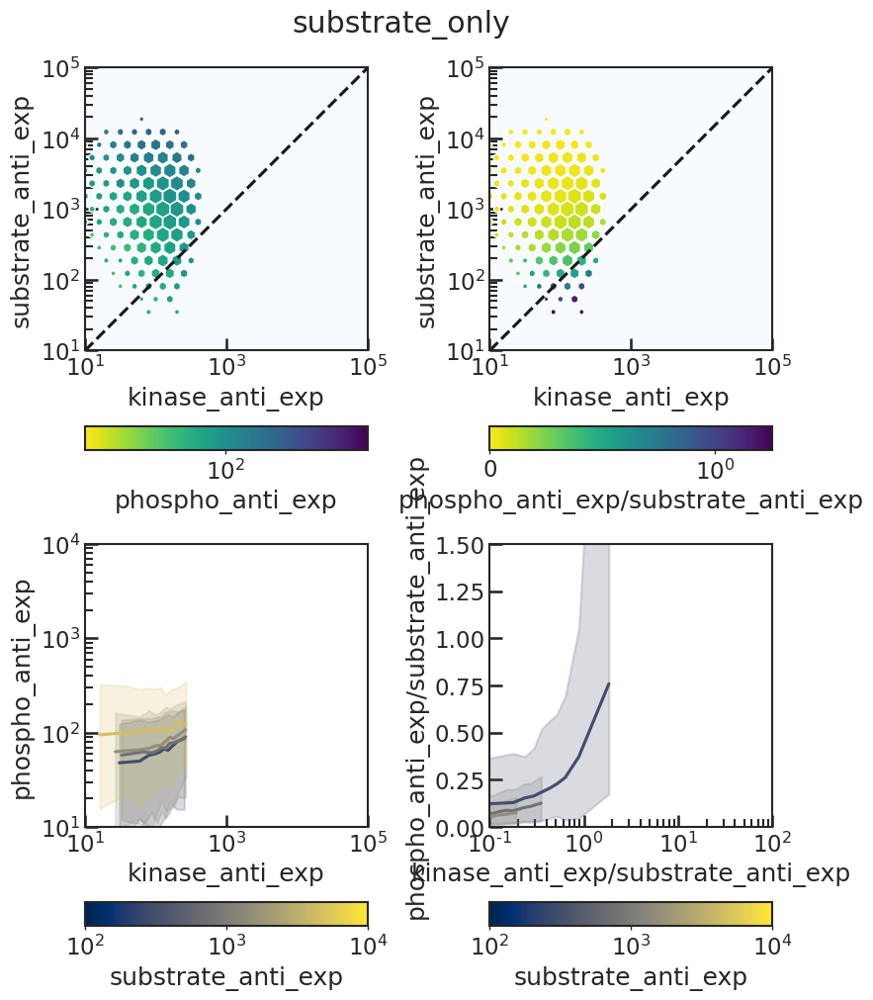

6.094925 179.136139
0.0013999284456038647 14.865000903649088


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


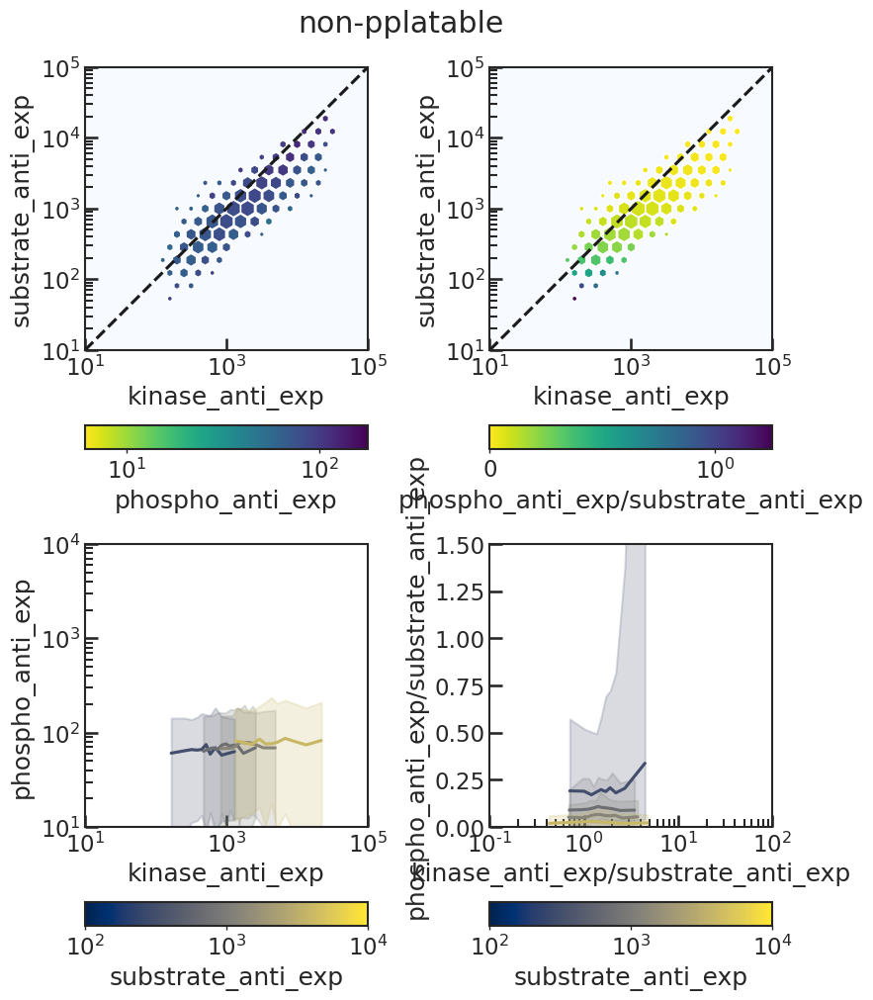

4.332357 456.005066
0.003436146928490974 9.802018853402002


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


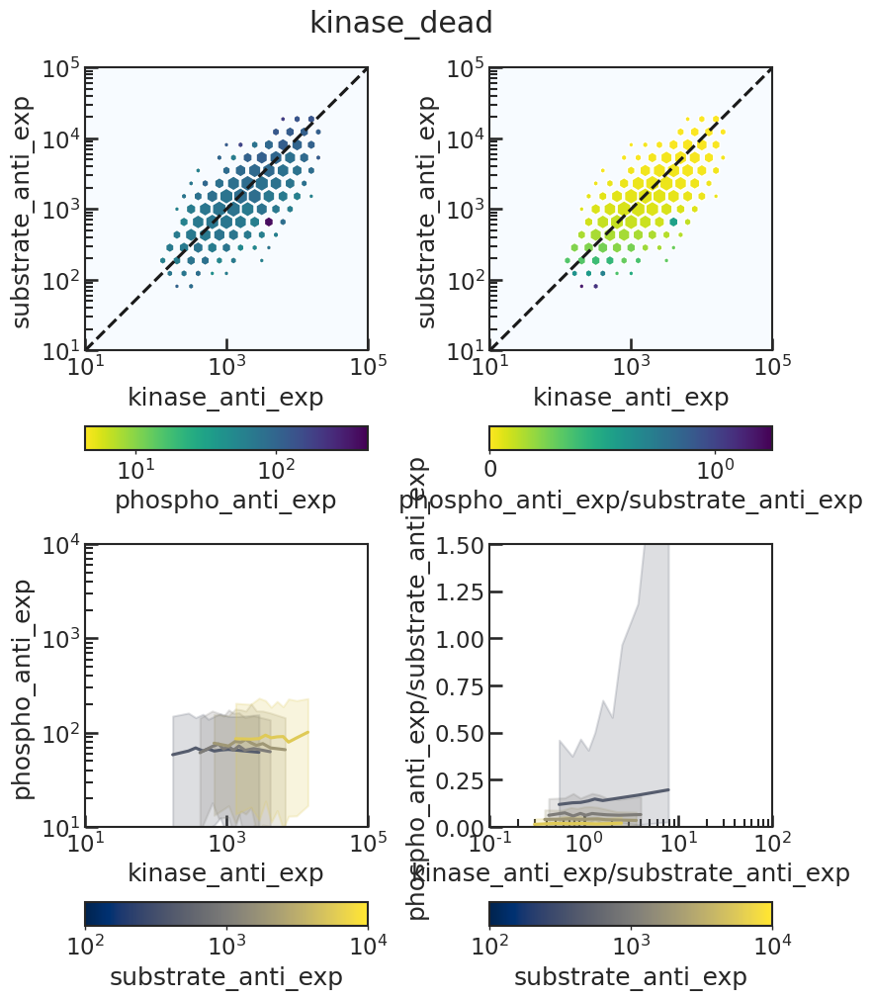

12.834603 4472.226242
0.0025029466470824022 17.166476516474365


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


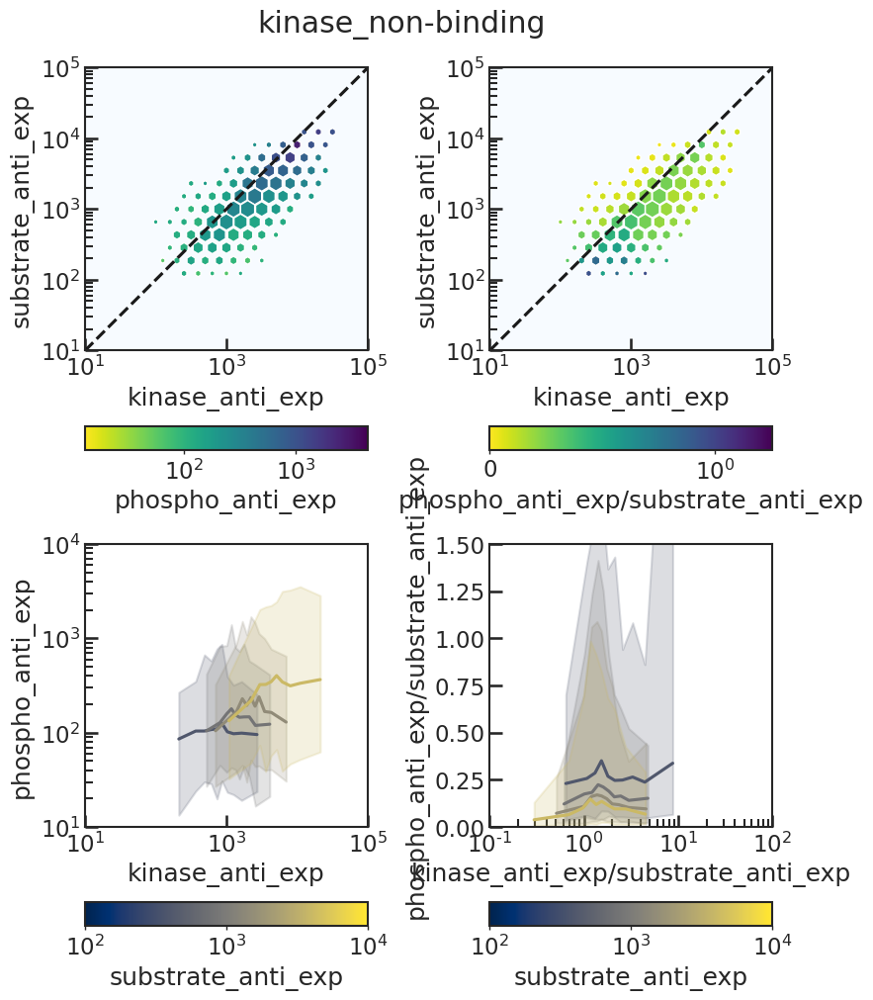

3.962029 1234.474365
0.00031380080152660234 6.673170425689411


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


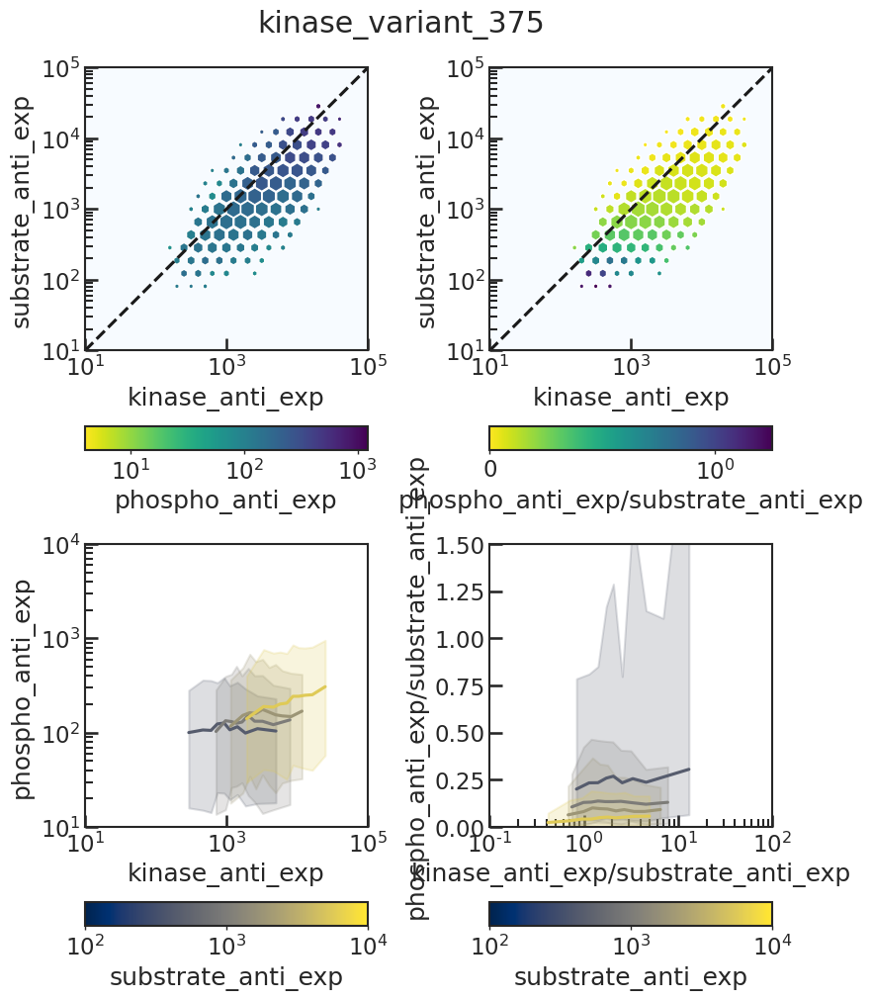

2.752867 3387.57193
0.001022356492186199 13.63914708731929


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


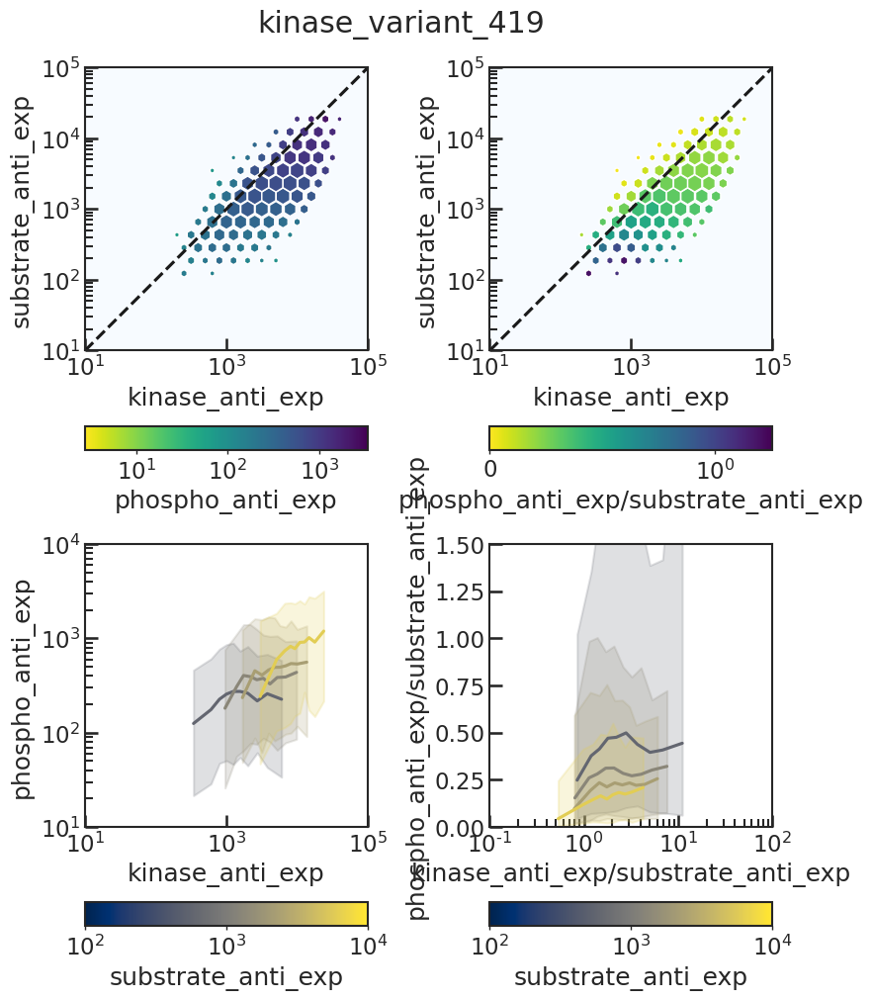

13.542397 25139.20898
0.003462595229786288 7.355846113932342


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


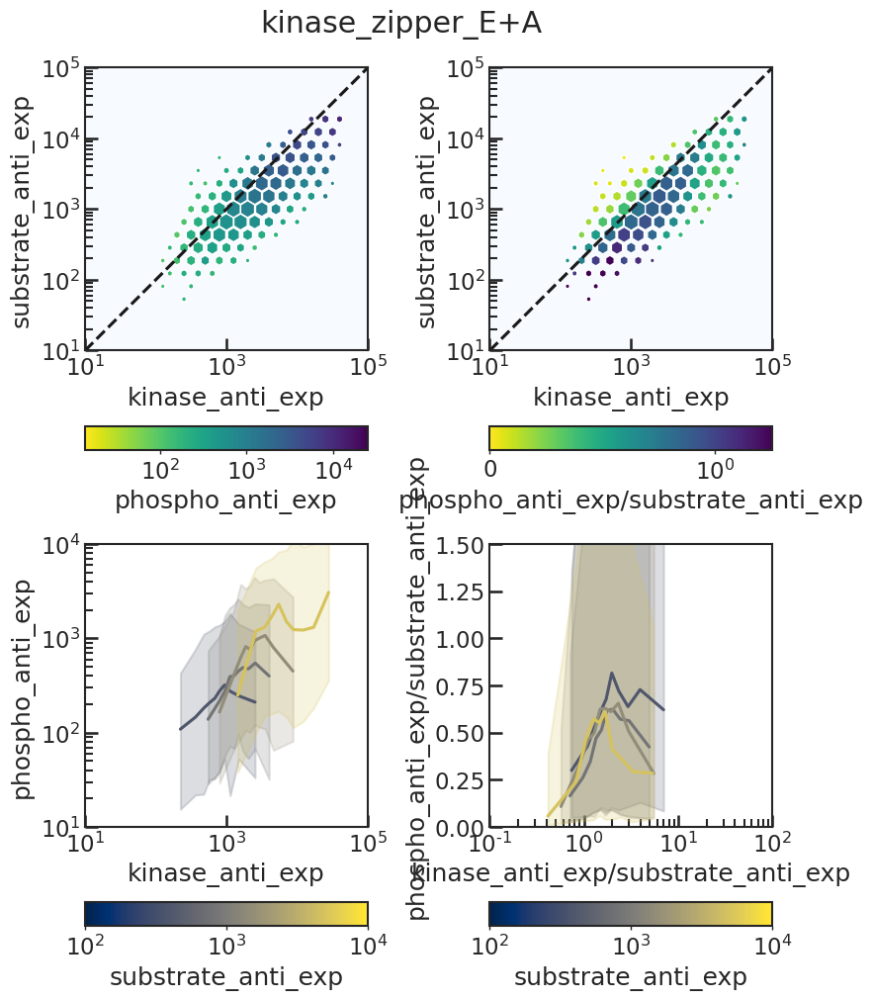

12.528432 18627.46875
0.008497156104213954 26.57350987911449


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


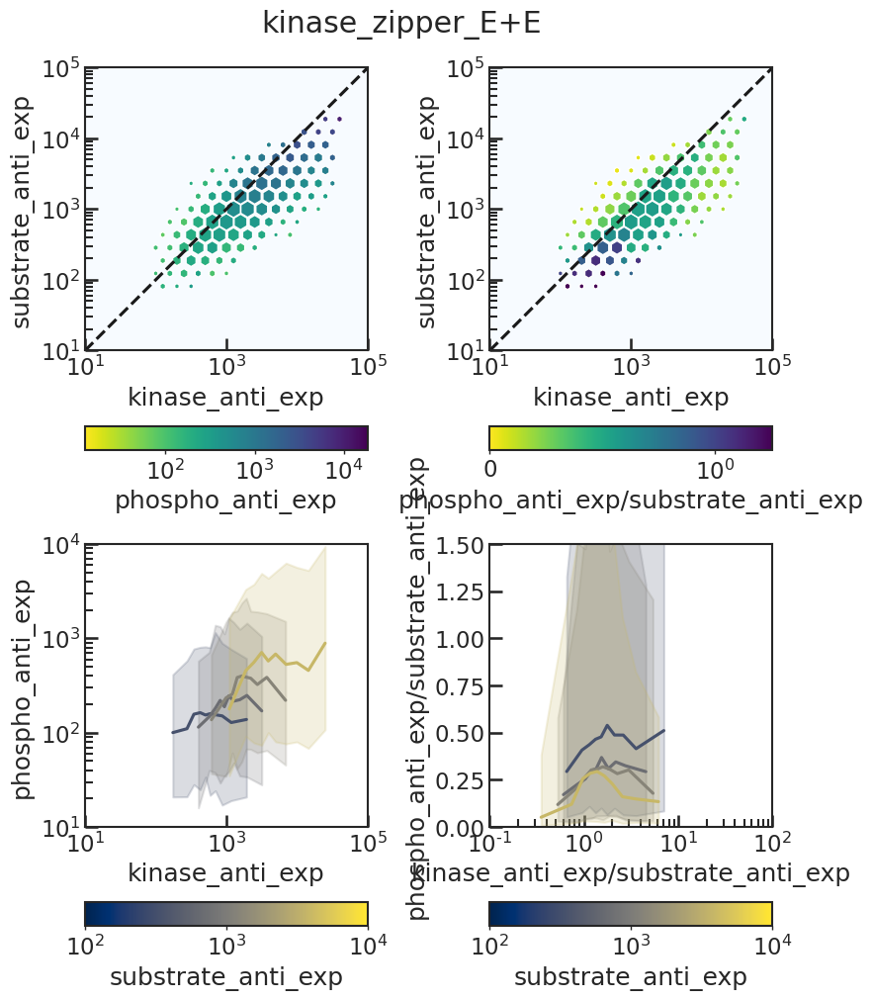

2.241255 26397.820393666665
0.0014889352424349027 19.92829791852033


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


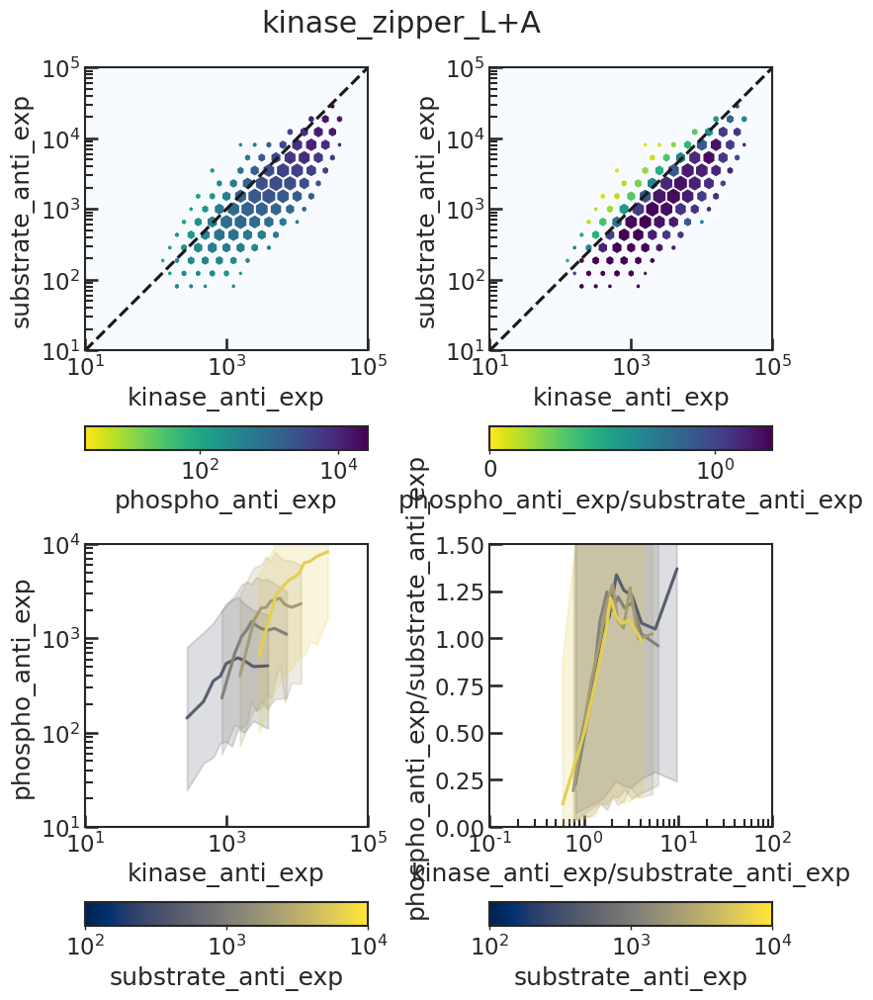

7.446093 11237.69629
0.003665299082276807 21.021141483547307


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


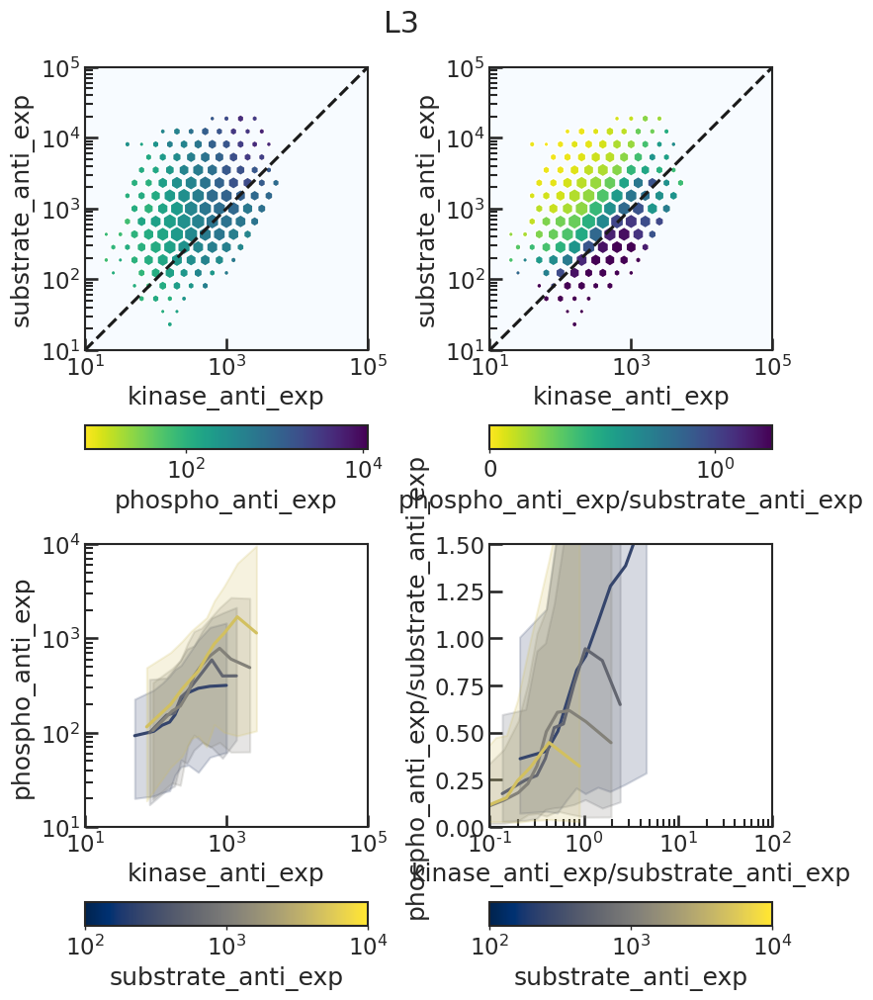

15.729012 12717.2832
0.008435071700492045 28.653299508448942


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


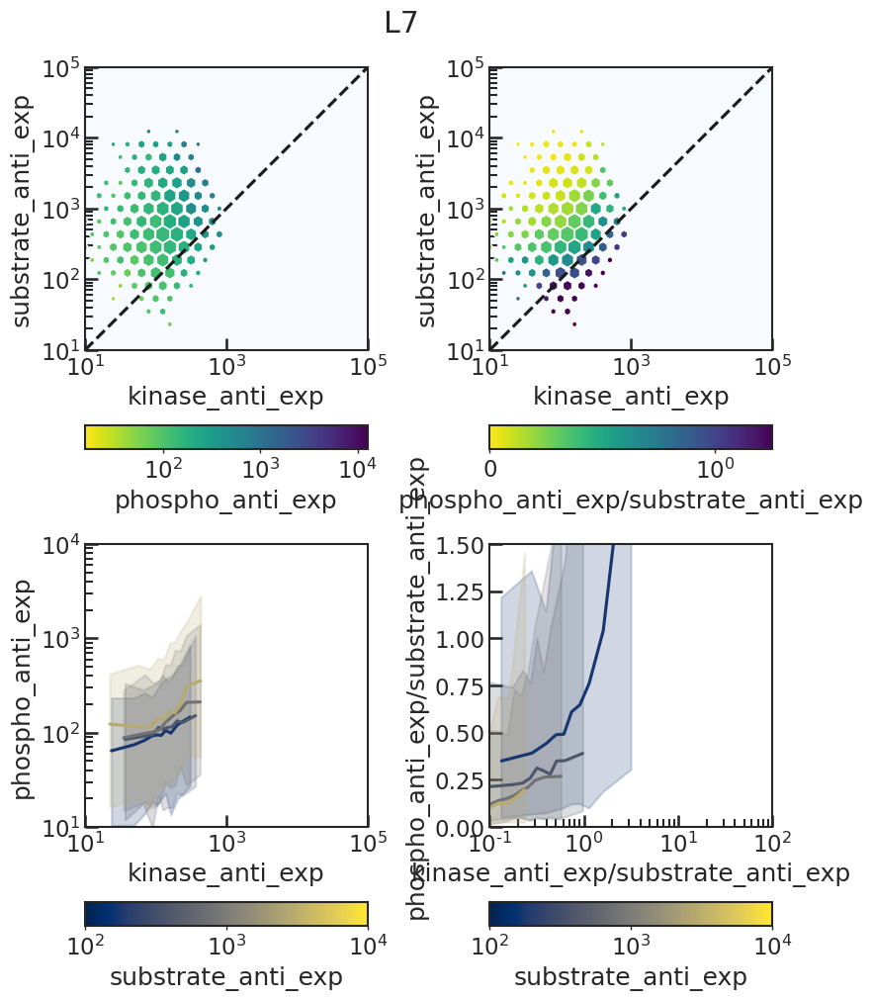

25.24119 56488.11719
0.005056291493981328 21.84868343615768


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


28.379368 56488.11719
0.013727782489552589 34.822738343212094


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


12.628864 56488.11719
0.025891684690530534 34.822738343212094


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


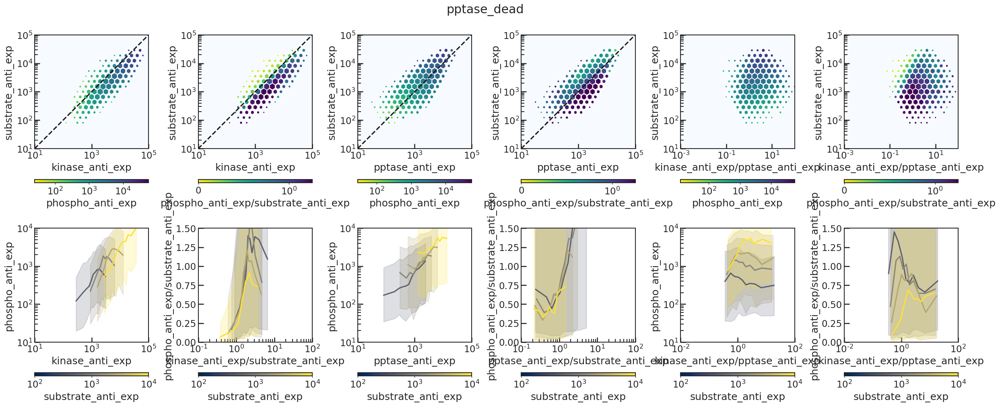

12.792937 29727.490645157897
0.012827112998236172 98.85173265574679


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


12.792937 24775.83203
0.013044856799286372 98.85173265574679


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


12.792937 49284.21875
0.02694881423489118 98.85173265574679


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


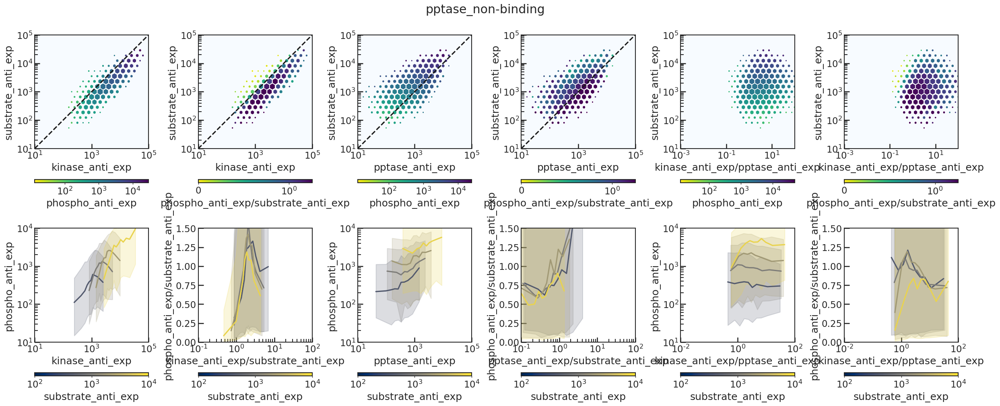

4.74003 1984.282593
0.0021332050614292137 9.929688858780935


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


5.516672 3664.529053
0.012100930839274493 14.09619402116174


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


6.743689 3452.119710333333
0.003872963290320122 13.11115821470576


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


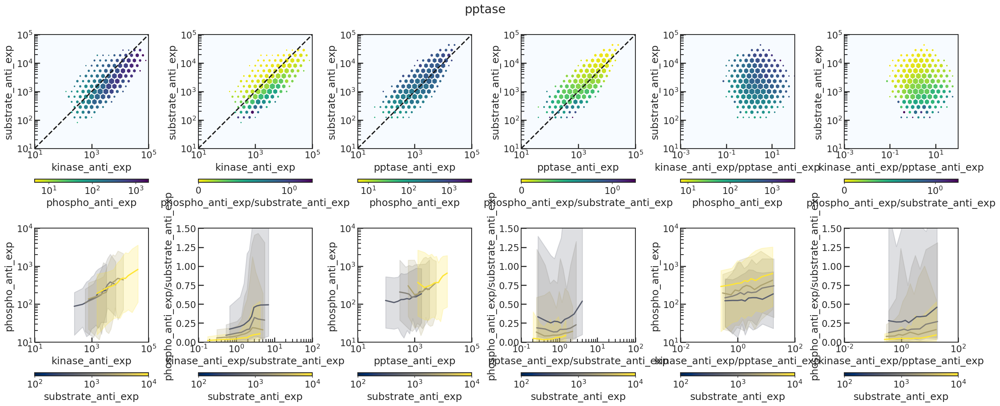

15.944068 3633.132987
0.008828591447810603 16.103635866041873


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


15.944068 7526.05957
0.008828591447810603 34.085017065537855


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


15.944068 4883.779297
0.012430092540462128 15.851330755779223


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


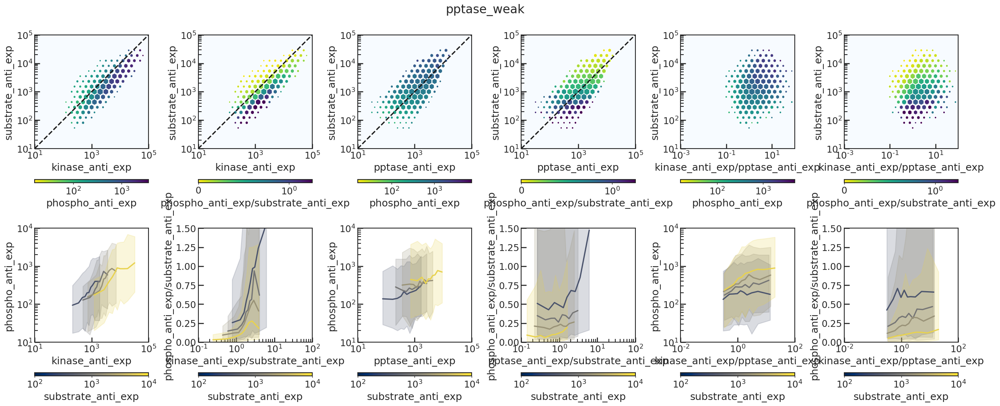

12.184426 7435.011719
0.0028488576843590653 17.785897000065603


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


2.472282 15744.17383
0.00025598239804048775 17.785897000065603


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


2.472282 6706.747559
0.00025598239804048775 17.785897000065603


../py_scripts/fig_plot.py:179: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
  val_norm = mpl.colors.SymLogNorm(linthresh=1.0, vmin=vmin, vmax=vmax)


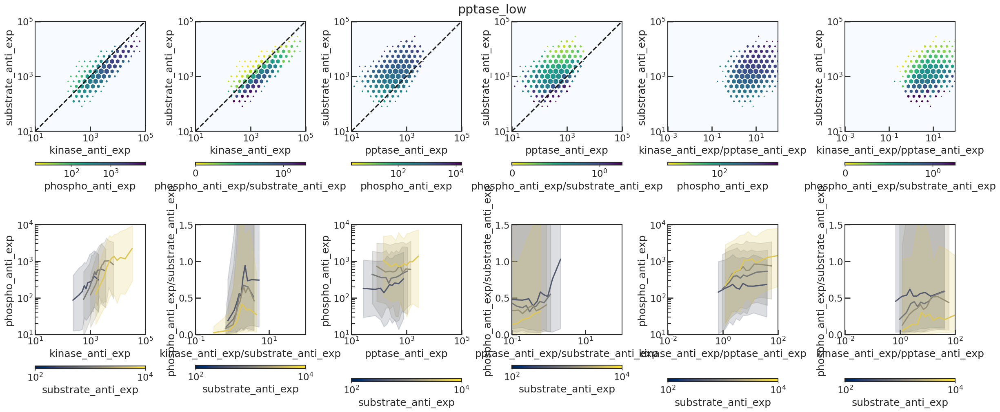

In [3]:
for exp_name, row in df_dataset_key.iterrows():
    
    if row['model'] == 'push' or row['model'] == "substrate_only" or row['model'] == "non-pplatable":
        fplot.plot_push_dataset_summary(df_data, exp_name)
    elif row['model'] == 'pushpull' or row['model'] == 'two_layer' or row['model'] == 'two_layer_nowriter':
        fplot.plot_pushpull_dataset_summary(df_data, exp_name)
                

    

# Setup noise models

In [32]:
# setup noise model dictionary
noise_models = {c:dict() for c in components}
print(noise_models)

try:
    with open("../data/"+label+"/noise_model_params.pkl", 'rb') as pkl_file:
        noise_model_params = pickle.load(pkl_file)
except:
    noise_model_params = {}
    
    
    
display(noise_model_params)

{'phospho': {}, 'substrate': {}, 'kinase': {}, 'pptase': {}, 'kinase2': {}, 'kinase2_phospho': {}}


{'two_layer': {'substrate': (72865.48597067442, 0.8382923885047529),
  'kinase': (15049.542842337578, 1.4802199551255244),
  'pptase': (1732.9280945369712, 1.8359894933027436),
  'kinase2': (44679.64090034746, 0.872434088631234)},
 'nb SH2': {'substrate': (56481.23500116062, 0.8204947436716405),
  'kinase': (11160.98822212567, 1.2874016218945155),
  'pptase': (3401.2730166663646, 1.4400655963434597),
  'kinase2': (67096.15088083109, 0.7284035260435534)},
 'no WT1': {'substrate': (51673.493869741986, 0.8483127522627181),
  'kinase': (79.11776938761922, 2.0),
  'pptase': (2.683836711394532, 0.9987698715460556),
  'kinase2': (9467.906776183378, 1.0947068935129536)},
 'WT2 dead': {'substrate': (57978.18987723145, 0.8064809779423883),
  'kinase': (9489.950529094807, 1.5236817824026068),
  'pptase': (1571.547266961192, 1.817727697574675),
  'kinase2': (55146.51380399052, 0.8642505061594664)},
 'mono': {'substrate': (94792.1284687588, 0.6729188838922266),
  'kinase': (31379.318540014014, 1.18

# Noise models for converting antibody to GFP units

Conversion takes place by fitting a linear regression model.

$\log(anti) = A \log(GFP) + B$

0.2887284460430575 [0.98362362]


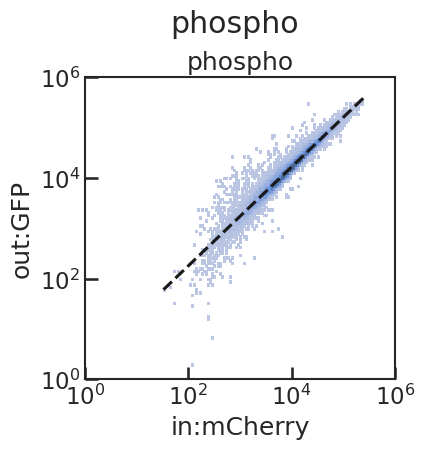

1.703277857915213 [0.68281524]


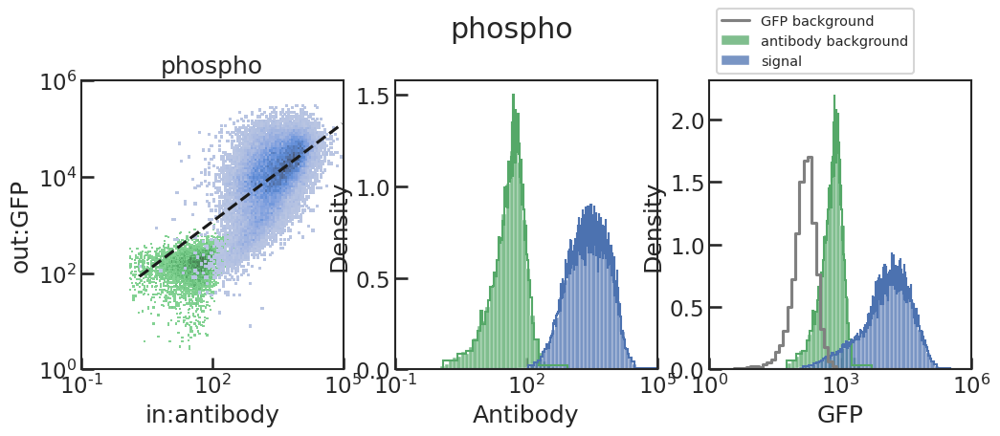

2.3148927494224147 [0.76476509]


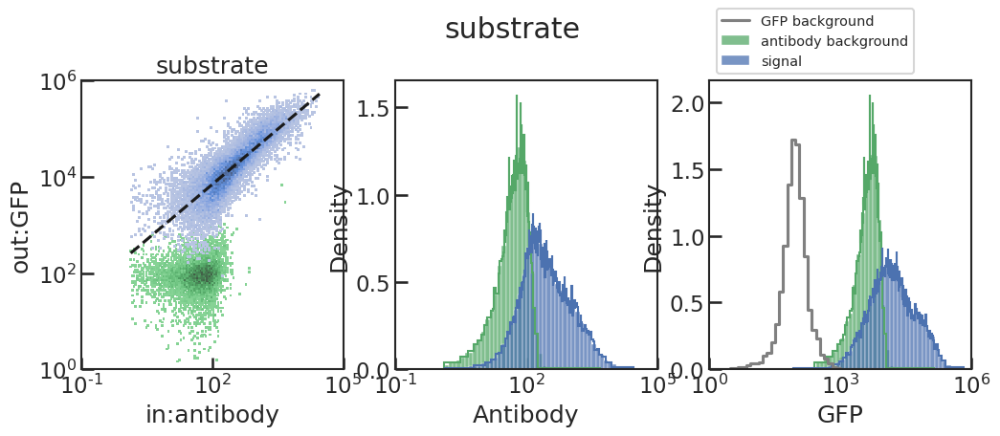

1.6677134713669286 [0.81617371]


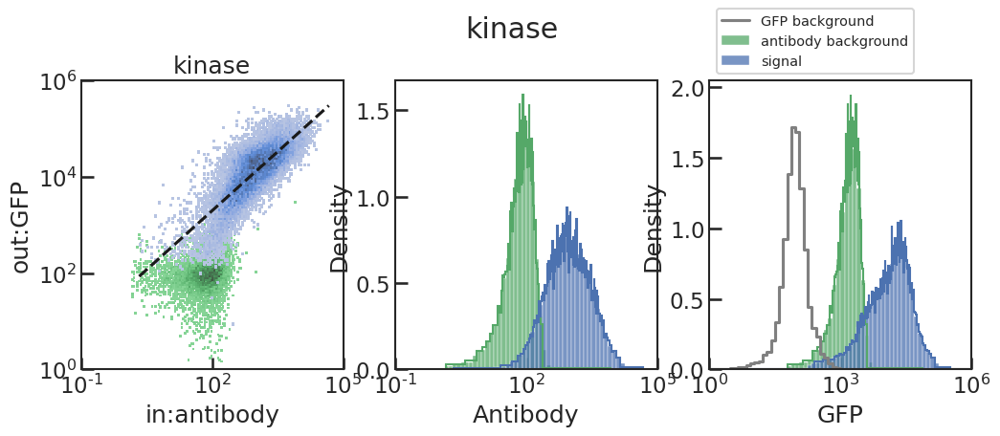

1.8993430017576545 [0.75373109]


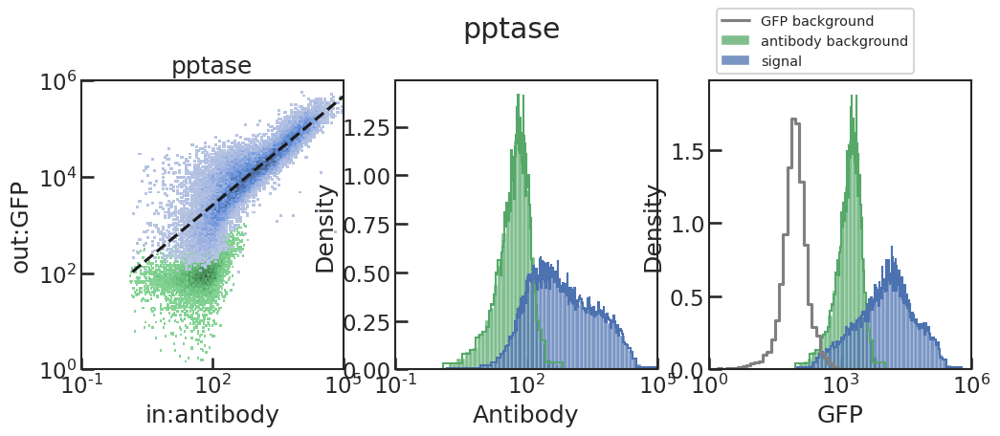

3.0393354255500897 [0.58137413]


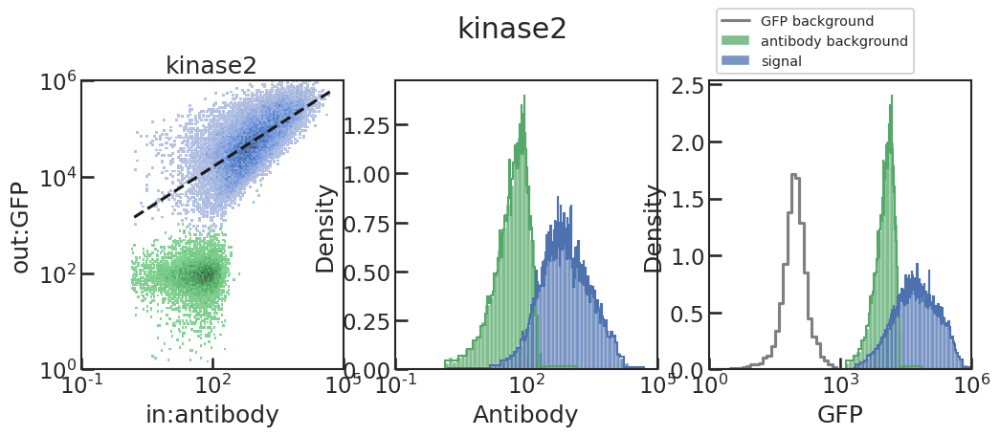

2.012963392778283 [0.71936857]


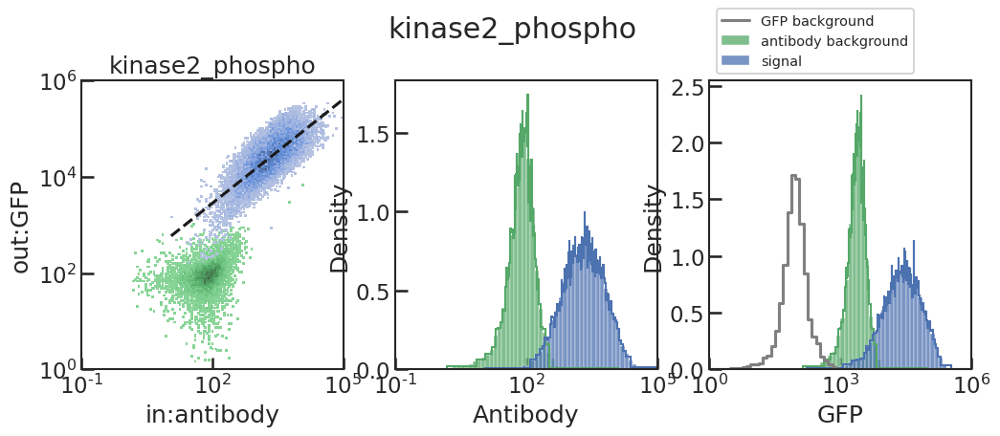

In [33]:
# points per bin
ppbin = 100

for c in components:
    
    # phospho noise is measured using mCherry instead of GFP, so first need to convert to GFP
    if c == 'phospho':
        
        # mCherry to GFP conversion
        df = pd.read_csv("../data/{}/GFP-mCherry.csv".format(label))    
        GFP = df['GFP'].values
        mCherry = df['mCherry'].values
        idx = (mCherry > 0.0) & (GFP > 0.0)
        GFP = GFP[idx]
        mCherry = mCherry[idx]
        noise_models[c]['mCherry2GFP'] = noise.LinearNoise(mCherry, GFP)
        
        
        fig, axes = plt.subplots(1, 1, figsize=(4, 4), squeeze=False)

        fig.suptitle(c, y=1.05)

        ax = axes[0, 0]

        noise_models[c]['mCherry2GFP'].plot(ax)

        ax.set_title(c)

        ax.set_ylabel('out:GFP')
        ax.set_xlabel('in:mCherry')

        ax.set_xlim(1e0, 1e6)
        ax.set_ylim(1e0, 1e6)
        
        plt.show()

        
        
    # distribution of antibodies and GFP for non-empty cells
    df = pd.read_csv("../data/{}/{}.csv".format(label, df_MOCU_key.loc[c, 'file_name']))    
    anti = df[df_MOCU_key.loc[c, 'anti_col_name']].values
    GFP = df[df_MOCU_key.loc[c, 'GFP_col_name']].values
    idx = (anti > 0.0) & (GFP > 0.0)
    anti = anti[idx]
    GFP = GFP[idx]
    
    
    
    noise_models[c]['anti'] = noise.BackgroundDist(anti, ppbin=ppbin)
    noise_models[c]['GFP'] = noise.BackgroundDist(GFP, ppbin=ppbin)
    
    # linear mode for converting antibody to GFP measurements
    noise_models[c]['anti2GFP'] = noise.LinearNoise(anti, GFP)
    
    
    # distribution of antibodies and GFP for empty cells
    df = pd.read_csv("../data/{}/{}.csv".format(label, df_MOCU_key.loc['empty_'+c, 'file_name']))
    anti = df[df_MOCU_key.loc['empty_'+c, 'anti_col_name']].values
    GFP = df[df_MOCU_key.loc['empty_'+c, 'GFP_col_name']].values
    idx = (anti > 0.0) & (GFP > 0.0)
    anti = anti[idx]
    GFP = GFP[idx]
    
    # if phospho, convert mCherry to GFP
    if c == 'phospho':
        GFP = noise_models[c]['mCherry2GFP'].transform(GFP)
    
    noise_models[c]['anti_background'] = noise.BackgroundDist(anti, ppbin=ppbin)
    noise_models[c]['GFP_background'] = noise.BackgroundDist(GFP, ppbin=ppbin)

    
    # convert antibody background to GFP units
    empty_anti_as_GFP = noise_models[c]['anti2GFP'].transform(noise_models[c]['anti_background'].get_data())       
    
    noise_models[c]['anti_as_GFP_background'] = noise.BackgroundDist(empty_anti_as_GFP, ppbin=ppbin)
    
    # lognormal noise model with background
    noise_models[c]['GFP2MOCU'] = noise.LogNormalBGNoise(noise_models[c]['anti_as_GFP_background'])
        
    

        
    fig, axes = plt.subplots(1, 3, figsize=(12, 4), squeeze=False)
    
    fig.suptitle(c, y=1.05)
    
    ax = axes[0, 0]
    
    sns.histplot(x=noise_models[c]['anti_background'].get_data(), y=noise_models[c]['GFP_background'].get_data(), 
                              bins=(100, 100), color='g',
                         log_scale=(True, True), ax = ax)
    
    noise_models[c]['anti2GFP'].plot(ax)
    
    ax.set_title(c)
    
    ax.set_ylabel('out:GFP')
    ax.set_xlabel('in:antibody')
    
    ax.set_xlim(1e-1, 1e5)
    ax.set_ylim(1e0, 1e6)
    

    ax = axes[0, 1]
    
    noise_models[c]['anti_background'].plot(ax, color='g')
    noise_models[c]['anti'].plot(ax, color='b')
    
    sns.histplot(noise_models[c]['anti_background'].get_data(), binrange=(-1, 5), log_scale=True, bins=64, ax=ax, 
                 label='background', fill=True, color='g', stat='density')
    sns.histplot(noise_models[c]['anti'].get_data(), binrange=(-1, 5), log_scale=True, bins=64, ax=ax, 
                 label='signal', fill=True, color='b', stat='density')
  


    ax.set_xscale('log')
    ax.set_xlabel("Antibody")

    ax.set_xlim(1e-1, 1e5)


    ax = axes[0, 2]
    
    noise_models[c]['anti_as_GFP_background'].plot(ax, color='g')
    noise_models[c]['GFP'].plot(ax, color='b')

    sns.histplot(noise_models[c]['GFP_background'].get_data(), binrange=(0, 6), log_scale=True, bins=64, ax=ax, 
                 label='GFP background', fill=False, color='grey', stat='density', element='step')
    sns.histplot(noise_models[c]['anti_as_GFP_background'].get_data(), binrange=(0, 6), log_scale=True, bins=64, ax=ax, 
                 label='antibody background', fill=True, color='g', stat='density')
    sns.histplot(noise_models[c]['GFP'].get_data(), binrange=(0, 6), log_scale=True, bins=64, ax=ax, 
                 label='signal', fill=True, color='b', stat='density')

    
    ax.set_xscale('log')
    ax.set_xlabel("GFP")
    
    ax.legend(loc='lower left', fontsize='xx-small', bbox_to_anchor=(0.0, 1.0), ncol=1)

    ax.set_xlim(1e0, 1e6)

    plt.show()
    


# Convert antibody measurements to GFP units

In [34]:
for c in components:
    df_data[c+'_GFP_infer'] = 0.0
    
for exp_name, row in df_dataset_key.iterrows():
    
    print(exp_name)
        
    df_tmp = df_data.query("exp_name==@exp_name")
    
    for c in components:

        # a weird way to check for nans or empty values
        if row[c+'_col'] != row[c+'_col']:
            continue
            
        
        df_data.loc[df_tmp.index, c+'_GFP_infer'] = noise_models[c]['anti2GFP'].transform(df_data.loc[df_tmp.index, c+'_anti_exp'])
        
        
display(df_data)

two_layer
nb SH2
no WT1
WT2 dead
mono
no pptase
med pptase
high pptase


kinase_anti_exp  phospho_anti_exp  pptase_anti_exp  \
exp_name    cell_index                                                       
two_layer   0               1132.644775       1478.883301      1425.913330   
            4               1442.491699        635.542847        88.930649   
            5               8793.622070        812.160950       146.514679   
            6               1792.821777       2214.880127        89.025887   
            8                201.405777       3024.554932       153.496933   
...                                 ...               ...              ...   
high pptase 195            59299.445310       7855.000977      9795.748047   
            196              208.313751        372.908508       202.584320   
            197            25951.003910       1579.916382      2093.736084   
            198              211.491653        507.318298       604.008911   
            199              446.477600        933.396423      2162.141357   

                        substrate_anti_exp  kinase2_anti_exp  \
exp_name    cell_index                                         
two_layer   0                  2399.792236       1518.167847   
            4                   523.847473       1035.239136   
            5                  7245.374023       2681.130859   
            6                  6909.660156       2263.580078   
            8                  3585.488770        449.934784   
...                                    ...               ...   
high pptase 195               19908.082030       3428.847656   
            196                1147.973999        294.995239   
            197                8990.183594        706.717163   
            198                 991.847046        712.914246   
            199                1407.085327       1187.735229   

                        kinase2_phospho_anti_exp  phospho_GFP_infer  \
exp_name    cell_index                                                
two_layer   0                        1701.817749        7374.915290   
            4                        5222.672852        4142.932616   
            5                       18908.003910        4898.079478   
            6                       14202.298830        9717.039625   
            8                        1672.440430       12020.611395   
...                                          ...                ...   
high pptase 195                     16475.460940       23064.448401   
            196                       786.826538        2878.770825   
            197                      5654.137207        7715.320440   
            198                      1160.248291        3552.095459   
            199                      1436.169312        5386.222318   

                        substrate_GFP_infer  kinase_GFP_infer  \
exp_name    cell_index                                          
two_layer   0                  79420.305908      14467.199881   
            4                  24799.658349      17623.765918   
            5                 184898.125267      77061.869262   
            6                 178309.792432      21045.775626   
            8                 107966.060818       3533.754738   
...                                     ...               ...   
high pptase 195               400534.913582     365891.161101   
            196                45187.879803       3632.370139   
            197               218070.502652     186393.196494   
            198                40408.158389       3677.533840   
            199                52798.102455       6767.220162   

                        pptase_GFP_infer  kinase2_GFP_infer  \
exp_name    cell_index                                        
two_layer   0               18909.544251       77423.440344   
            4                2335.628088       61972.939073   
            5                3402.788514      107763.290289   
            6                2337.513133       97662.304445   
            8               

# Construct noise model to remove background


two_layer


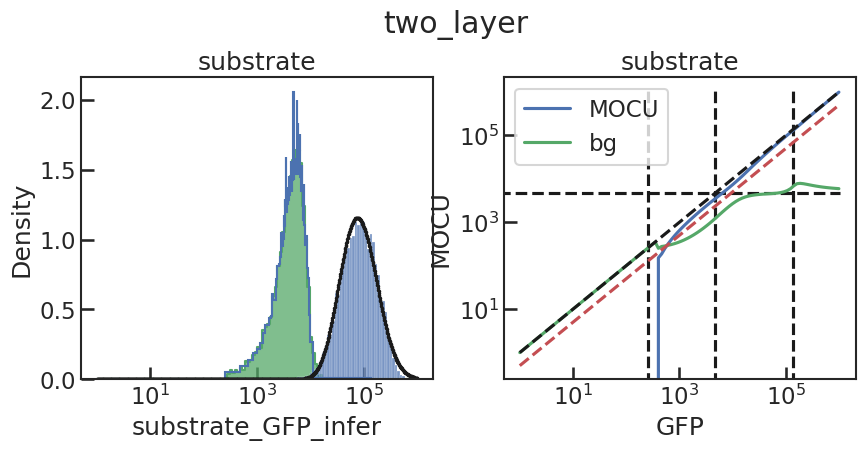

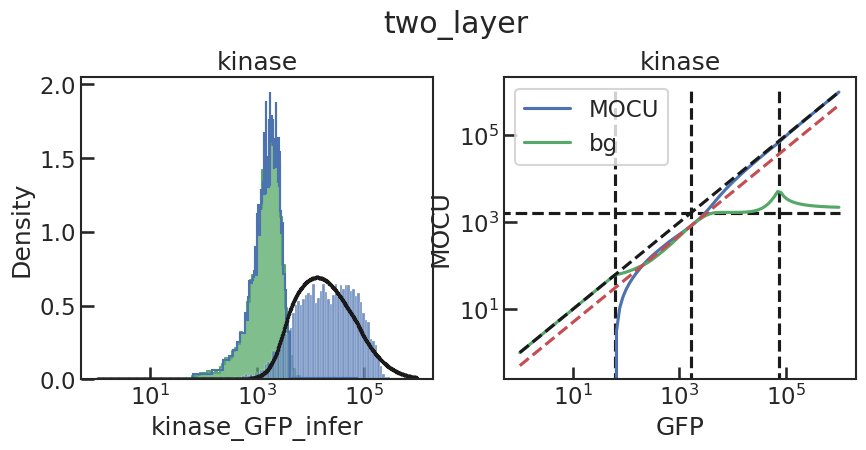

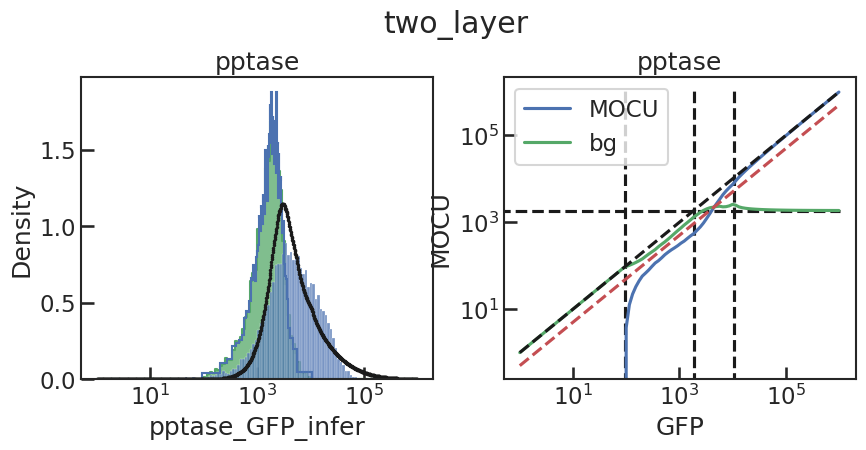

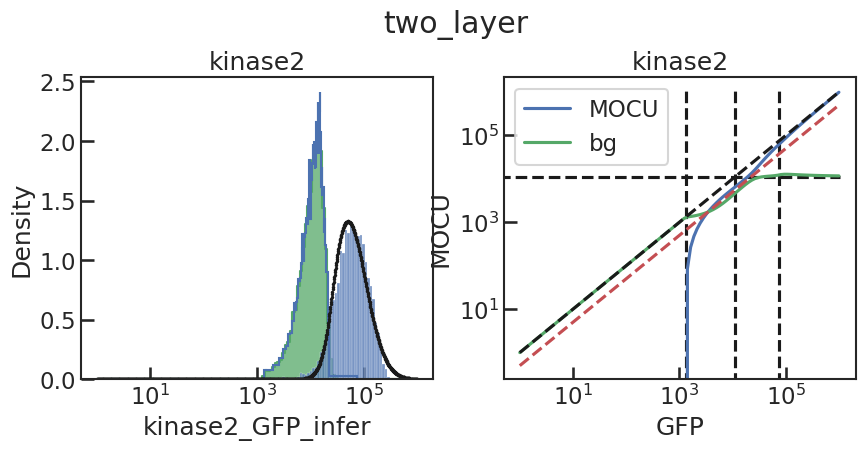

nb SH2


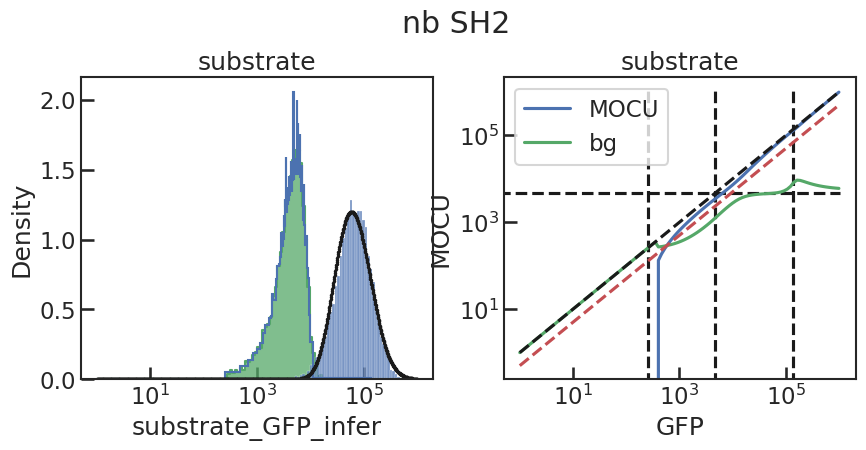

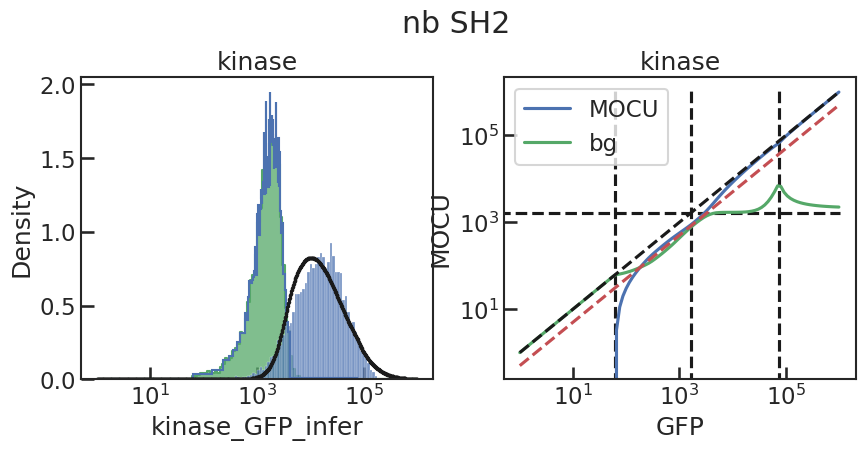

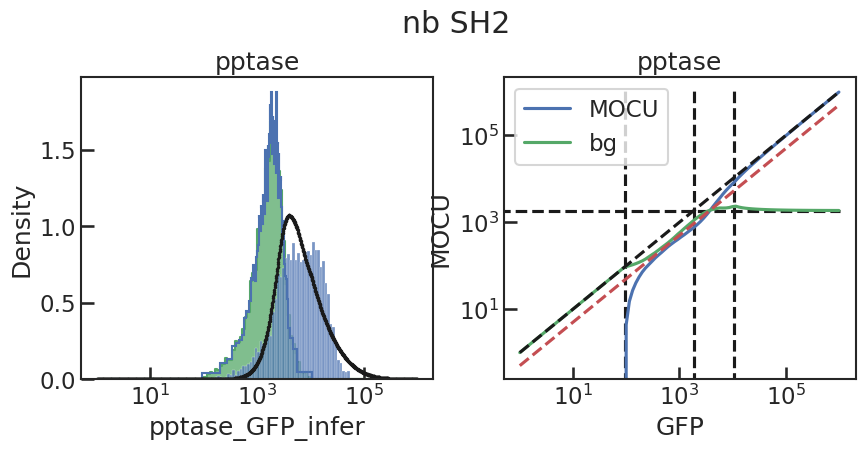

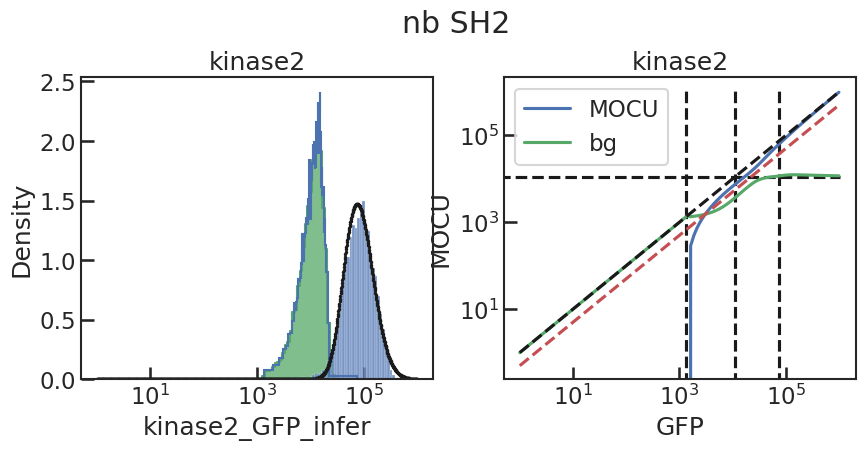

no WT1


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/projectnb/biophys/jrocks/.conda/envs/default/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3457, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/scratch/7244536.1.b/ipykernel_26821/4084228143.py", line 101, in <module>
    plt.show()
  File "/projectnb/biophys/jrocks/.conda/envs/default/lib/python3.7/site-packages/matplotlib/pyplot.py", line 353, in show
    return _backend_mod.show(*args, **kwargs)
  File "/projectnb/biophys/jrocks/.conda/envs/default/lib/python3.7/site-packages/matplotlib_inline/backend_inline.py", line 43, in show
    metadata=_fetch_figure_metadata(figure_manager.canvas.figure)
  File "/projectnb/biophys/jrocks/.conda/envs/default/lib/python3.7/site-packages/IPython/core/display.py", line 320, in display
    format_dict, md_dict = format(obj, include=include, exclude=exclude)
  File "/projectnb/biophys/jrocks/.conda/envs/default/lib/python3.7/site-packages/IPython/core/form

TypeError: object of type 'NoneType' has no len()

In [7]:
for exp_name, row in df_dataset_key.iterrows():
    
    print(exp_name)
        
    df_tmp = df_data.query("exp_name==@exp_name")
    
    if exp_name not in noise_model_params:
        noise_model_params[exp_name] = {}
    
    for c in components:
        
        if c == 'phospho' or c == 'kinase2_phospho':
            continue

        # a weird way to check for nans or empty values
        if row[c+'_col'] != row[c+'_col']:
            continue
            
            
        bg_noise = noise_models[c]['anti_as_GFP_background']
        MOCU_noise = noise_models[c]['GFP2MOCU']
        
        GFP = df_data.loc[df_tmp.index, c+'_GFP_infer'] 
        
        # fit background noise model if doesn't exist
        if c not in noise_model_params[exp_name]:

            params = fit.fit_bg_noise(GFP, MOCU_noise) 
  
        
            (mu, sigma) = params.tolist()
            c0 = np.exp(mu)
        
            noise_model_params[exp_name][c] = (c0, sigma)

        
        
        
        (c0, sigma) = noise_model_params[exp_name][c]   

        x = np.logspace(0, 6, 1000, base=10)

        y = MOCU_noise.calc_prob_meas(x, c0*np.ones_like(GFP), sigma)*x*np.log(10)

        fig, axes = plt.subplots(1, 2, figsize=(10, 4), squeeze=False)

        ax = axes[0, 0]
        
        
        ax.set_xscale('log')


        sns.histplot(bg_noise.get_data(), binrange=(0, 6), log_scale=True, bins=128, ax=ax, 
                             label='control', color='g', stat='density', element='step')

        bg_noise.plot(ax)

        sns.histplot(GFP, binrange=(0, 6), log_scale=True, bins=128, ax=ax, 
                             label='control', color='b', stat='density')
        
        
        ylim = ax.get_ylim()
        ax.plot(x, y, 'k.', ms=3.0)
        
        ax.set_ylim(*ylim)
        
        ax.set_title(c)

        
        ax = axes[0, 1]

        x = np.logspace(0, 6, base=10, num=100)

        MOCU = MOCU_noise.cal_mean_conc(x, c0*np.ones_like(x), sigma)

        ax.plot(x, MOCU, 'b-', label='MOCU')
        ax.plot(x, x-MOCU, 'g-', label='bg')

        ax.plot(x, x, 'k--')

        ax.plot(x, x/2, 'r--')


        ax.vlines([bg_noise.get_data().mean(), bg_noise.bin_edges[0], bg_noise.bin_edges[-1]], ymin=ax.get_ylim()[0], ymax=ax.get_ylim()[1], ls='--', color='k')

        ax.hlines(bg_noise.get_data().mean(), xmin=ax.get_xlim()[0], xmax=ax.get_xlim()[1], ls='--', color='k')

        ax.set_xscale('log')
        ax.set_yscale('log')


        ax.set_title(c)

        ax.set_ylabel('MOCU')
        ax.set_xlabel('GFP')

        ax.legend()
        
        fig.suptitle(exp_name, y=1.05)

        plt.show()
                        
        

# Save noise params

In [15]:
display(noise_model_params)

with open("../data/"+label+"/noise_model_params.pkl", 'wb') as pkl_file:
    pickle.dump(noise_model_params, pkl_file)
    

{'two_layer': {'substrate': (72865.48597067442, 0.8382923885047529),
  'kinase': (15049.542842337578, 1.4802199551255244),
  'pptase': (1732.9280945369712, 1.8359894933027436),
  'kinase2': (44679.64090034746, 0.872434088631234)},
 'nb SH2': {'substrate': (56481.23500116062, 0.8204947436716405),
  'kinase': (11160.98822212567, 1.2874016218945155),
  'pptase': (3401.2730166663646, 1.4400655963434597),
  'kinase2': (67096.15088083109, 0.7284035260435534)},
 'no WT1': {'substrate': (51673.493869741986, 0.8483127522627181),
  'kinase': (79.11776938761922, 2.0),
  'pptase': (2.683836711394532, 0.9987698715460556),
  'kinase2': (9467.906776183378, 1.0947068935129536)},
 'WT2 dead': {'substrate': (57978.18987723145, 0.8064809779423883),
  'kinase': (9489.950529094807, 1.5236817824026068),
  'pptase': (1571.547266961192, 1.817727697574675),
  'kinase2': (55146.51380399052, 0.8642505061594664)},
 'mono': {'substrate': (94792.1284687588, 0.6729188838922266),
  'kinase': (31379.318540014014, 1.18

# Transform to MOCU

In [35]:
for c in components:
    
    if c == 'phospho' or c == 'kinase2_phospho':
            continue
    
    df_data[c+'_MOCU_infer'] = 0.0

for exp_name, row in df_dataset_key.iterrows():
    
    print(exp_name)
        
    df_tmp = df_data.query("exp_name==@exp_name")
    
    for c in components:
        
        if c == 'phospho' or c == 'kinase2_phospho':
            continue

        # a weird way to check for nans or empty values
        if row[c+'_col'] != row[c+'_col']:
            continue
            
        MOCU_noise = noise_models[c]['GFP2MOCU']
        
        (c0, sigma) = noise_model_params[exp_name][c]
            
        GFP = df_data.loc[df_tmp.index, c+'_GFP_infer'] 
        
        MOCU = MOCU_noise.cal_mean_conc(GFP, c0*np.ones_like(GFP), sigma)
        
        df_data.loc[df_tmp.index, c+'_MOCU_infer']  = MOCU
        
        df_data.loc[df_tmp.index, c+'_GFP_denoise'] = MOCU + noise_models[c]['anti_as_GFP_background'].mean

display(df_data)

two_layer
nb SH2
no WT1
WT2 dead
mono
no pptase
med pptase
high pptase


kinase_anti_exp  phospho_anti_exp  pptase_anti_exp  \
exp_name    cell_index                                                       
two_layer   0               1132.644775       1478.883301      1425.913330   
            4               1442.491699        635.542847        88.930649   
            5               8793.622070        812.160950       146.514679   
            6               1792.821777       2214.880127        89.025887   
            8                201.405777       3024.554932       153.496933   
...                                 ...               ...              ...   
high pptase 195            59299.445310       7855.000977      9795.748047   
            196              208.313751        372.908508       202.584320   
            197            25951.003910       1579.916382      2093.736084   
            198              211.491653        507.318298       604.008911   
            199              446.477600        933.396423      2162.141357   

                        substrate_anti_exp  kinase2_anti_exp  \
exp_name    cell_index                                         
two_layer   0                  2399.792236       1518.167847   
            4                   523.847473       1035.239136   
            5                  7245.374023       2681.130859   
            6                  6909.660156       2263.580078   
            8                  3585.488770        449.934784   
...                                    ...               ...   
high pptase 195               19908.082030       3428.847656   
            196                1147.973999        294.995239   
            197                8990.183594        706.717163   
            198                 991.847046        712.914246   
            199                1407.085327       1187.735229   

                        kinase2_phospho_anti_exp  phospho_GFP_infer  \
exp_name    cell_index                                                
two_layer   0                        1701.817749        7374.915290   
            4                        5222.672852        4142.932616   
            5                       18908.003910        4898.079478   
            6                       14202.298830        9717.039625   
            8                        1672.440430       12020.611395   
...                                          ...                ...   
high pptase 195                     16475.460940       23064.448401   
            196                       786.826538        2878.770825   
            197                      5654.137207        7715.320440   
            198                      1160.248291        3552.095459   
            199                      1436.169312        5386.222318   

                        substrate_GFP_infer  kinase_GFP_infer  \
exp_name    cell_index                                          
two_layer   0                  79420.305908      14467.199881   
            4                  24799.658349      17623.765918   
            5                 184898.125267      77061.869262   
            6                 178309.792432      21045.775626   
            8                 107966.060818       3533.754738   
...                                     ...               ...   
high pptase 195               400534.913582     365891.161101   
            196                45187.879803       3632.370139   
            197               218070.502652     186393.196494   
            198                40408.158389       3677.533840   
            199                52798.102455       6767.220162   

                        pptase_GFP_infer  kinase2_GFP_infer  \
exp_name    cell_index                                        
two_layer   0               18909.544251       77423.440344   
            4                2335.628088       61972.939073   
            5                3402.788514      107763.290289   
            6                2337.513133       97662.304445   
            8               

# Save Inferred MOCU Values

In [28]:
df_data.to_csv("../data/"+label+"/model_predictions.csv", sep=',')

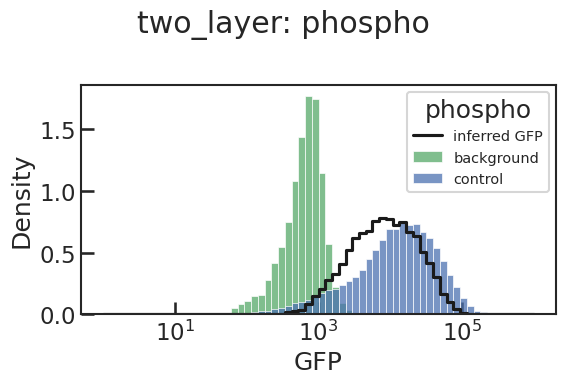

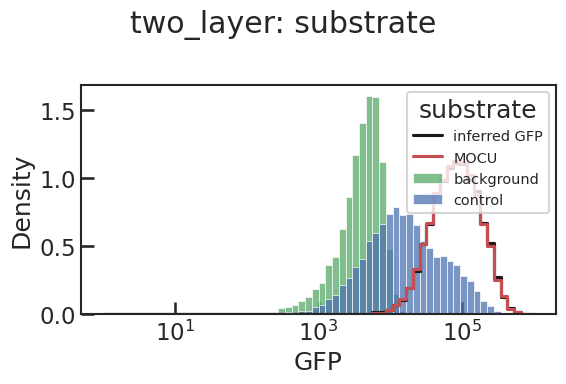

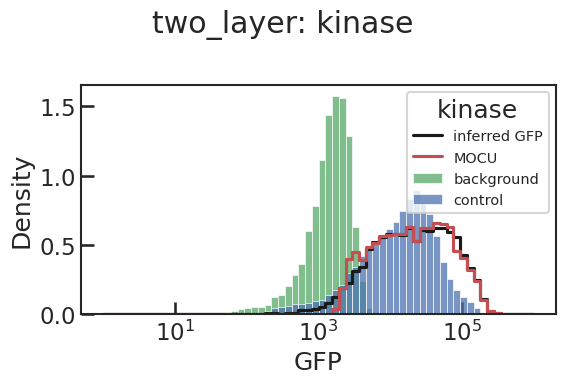

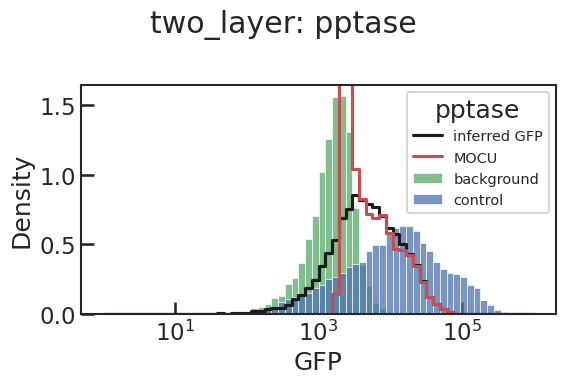

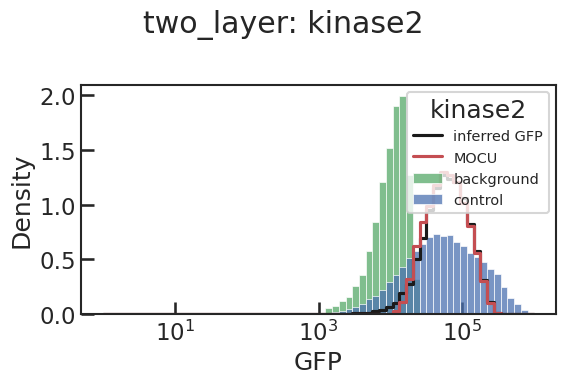

...

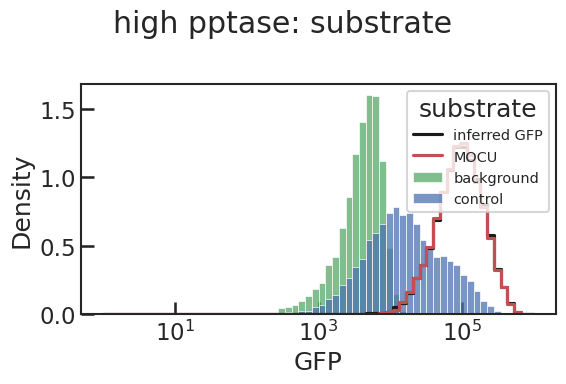

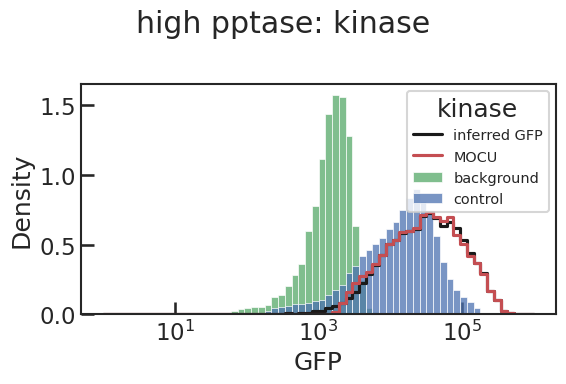

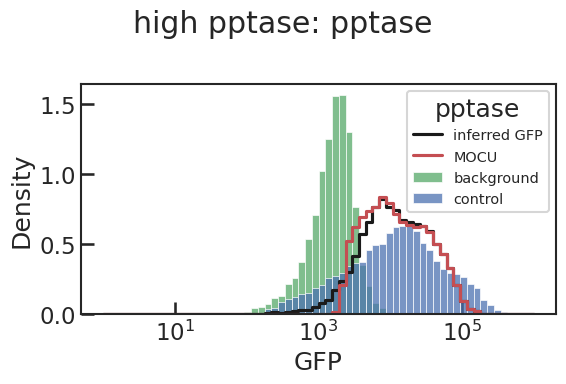

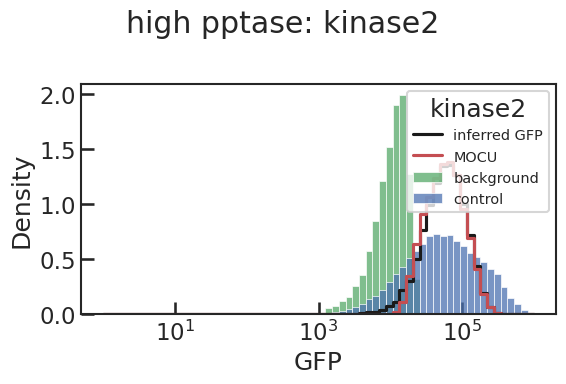

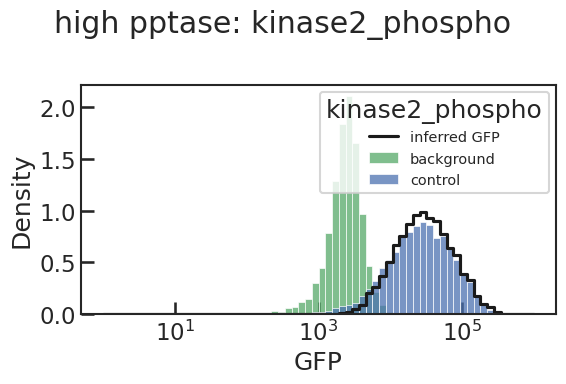

In [20]:

for exp_name, row in df_dataset_key.iterrows():
    
    df_tmp = df_data.query("exp_name==@exp_name")
    
    binrange = (0, 6)
        
    for c in components:
        
        # a weird way to check for nans or empty values
        if row[c+'_col'] != row[c+'_col']:
            continue
        
        fig, axes = plt.subplots(1, 1, figsize=(6, 4), squeeze=False)
    
        fig.suptitle(exp_name+": " + c)

        ax = axes[0, 0]

        sns.histplot(noise_models[c]['anti_as_GFP_background'].get_data(), binrange=binrange, log_scale=True, bins=64, ax=ax, 
                     label='background', color='g', stat='density')
        sns.histplot(noise_models[c]['GFP'].get_data(), binrange=binrange, log_scale=True, bins=64, ax=ax, 
                     label='control', color='b', stat='density')
        sns.histplot(df_tmp[c+"_GFP_infer"], binrange=binrange, log_scale=True, bins=64, ax=ax, 
                     label='inferred GFP', element='step', fill=False, color='k', stat='density')

        ylim = ax.get_ylim()
        
        if c != 'phospho' and c != 'kinase2_phospho':
            sns.histplot(df_tmp[c+"_GFP_denoise"], binrange=binrange, log_scale=True, bins=64, ax=ax, 
                         label='MOCU', element='step', fill=False, color='r', stat='density')

            ax.set_ylim(*ylim)
            
        ax.set_xscale('log')
        ax.set_xlabel("GFP")
        
        ax.legend(loc='upper right', fontsize='xx-small', title=c)
            



        plt.tight_layout()
        plt.show()
        

                

    

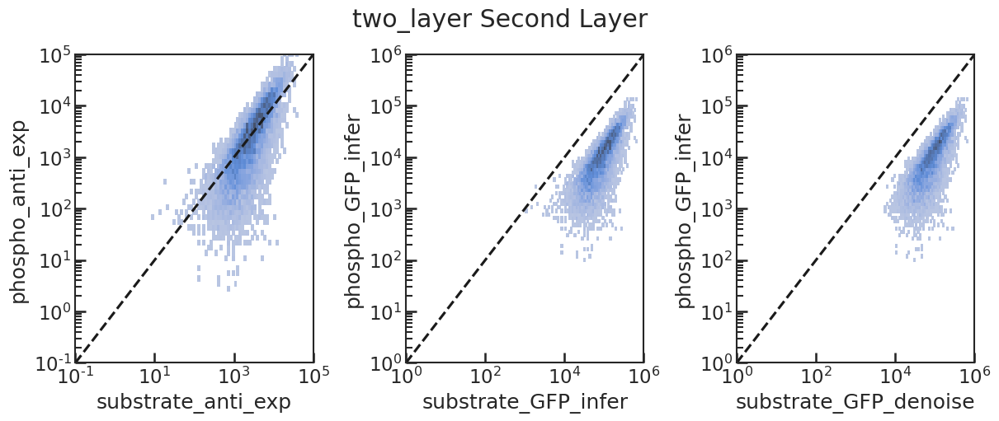

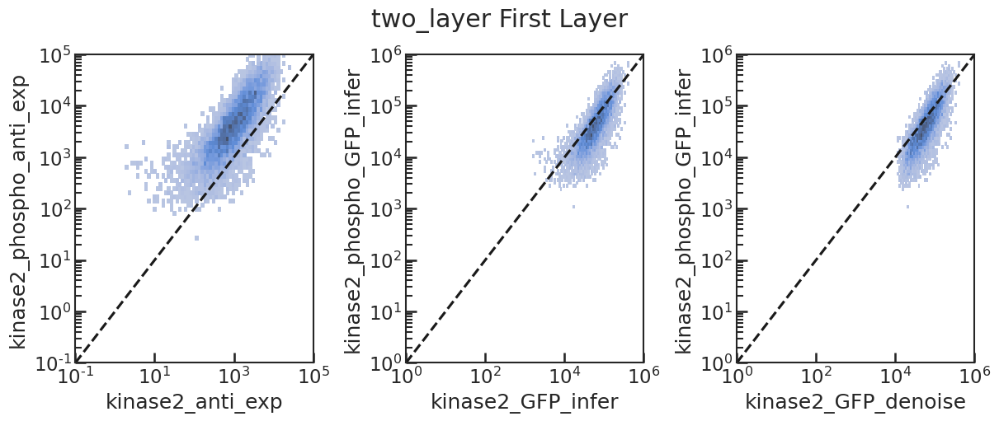

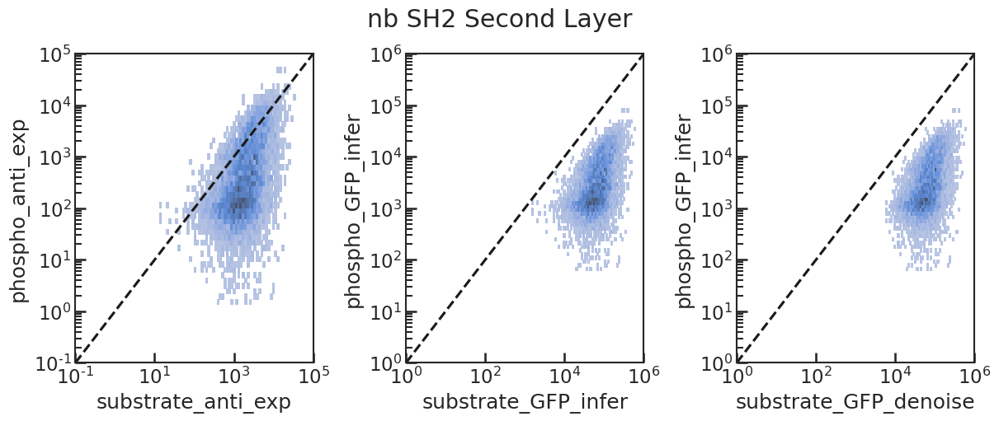

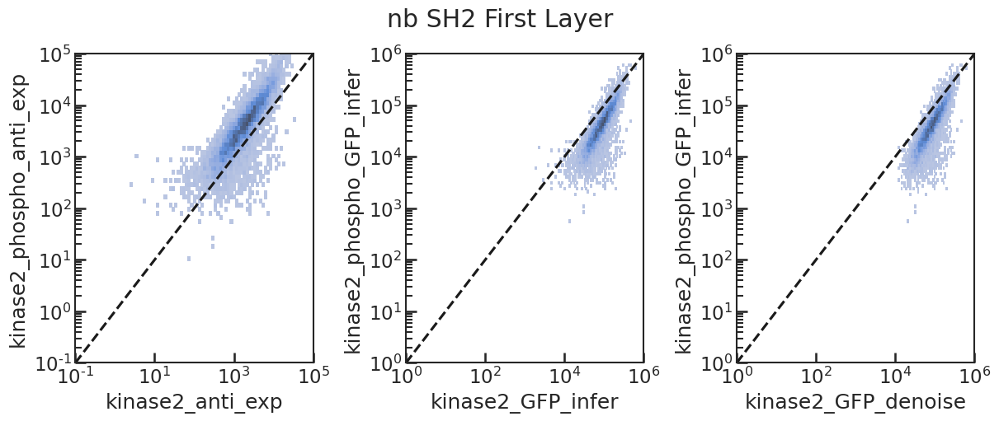

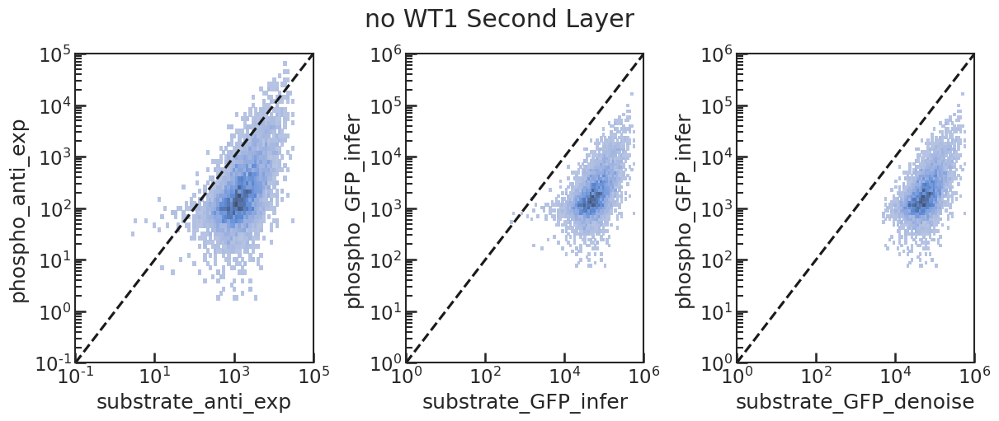

...

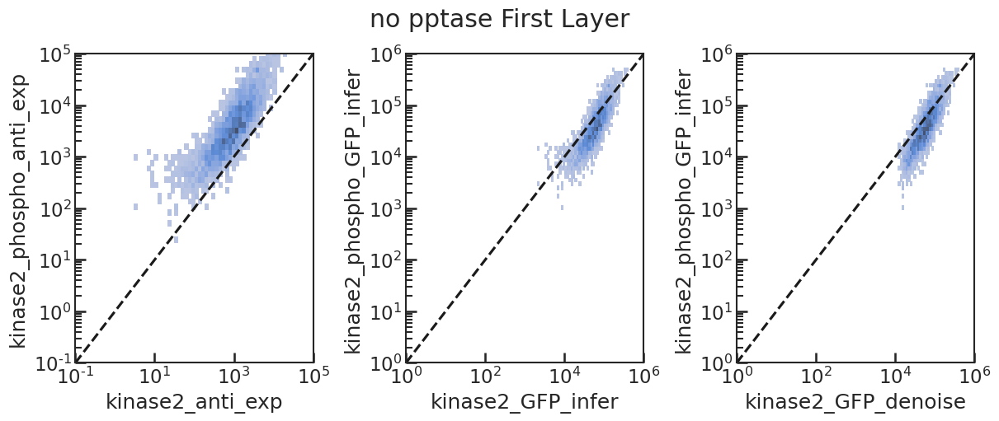

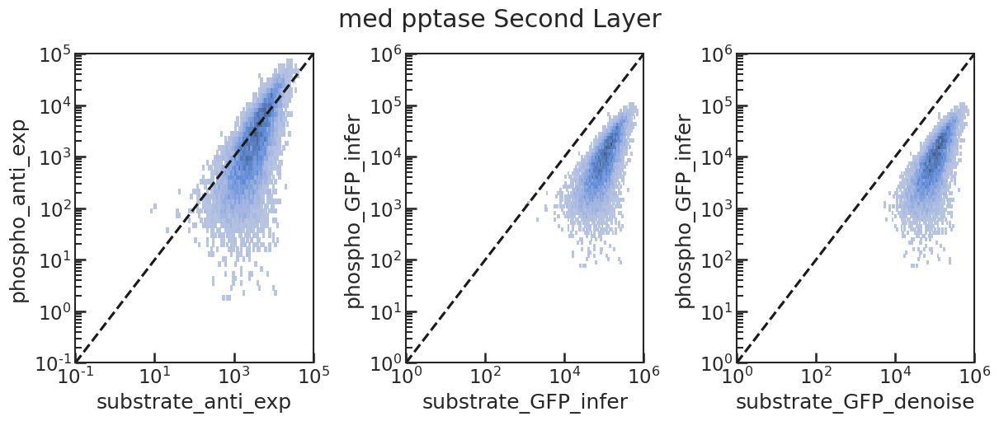

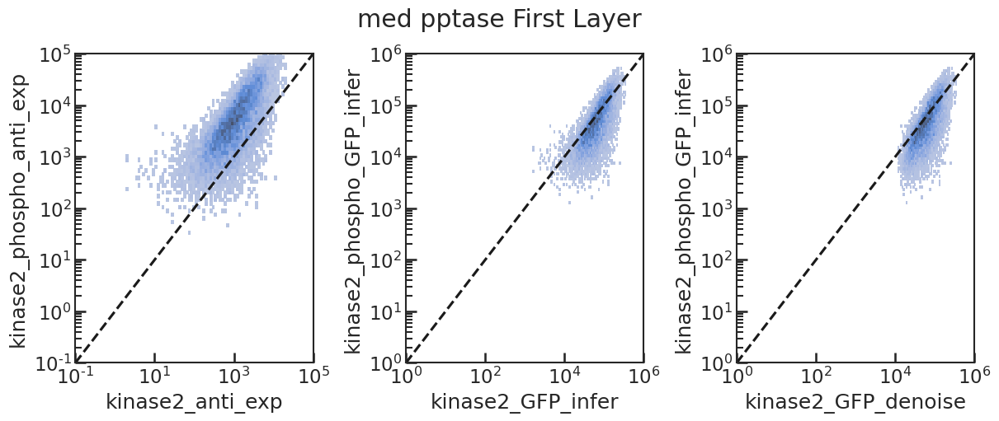

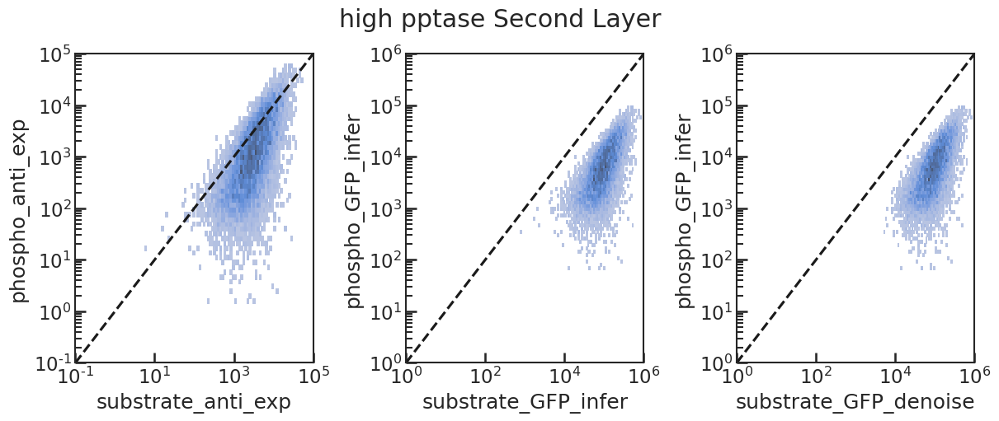

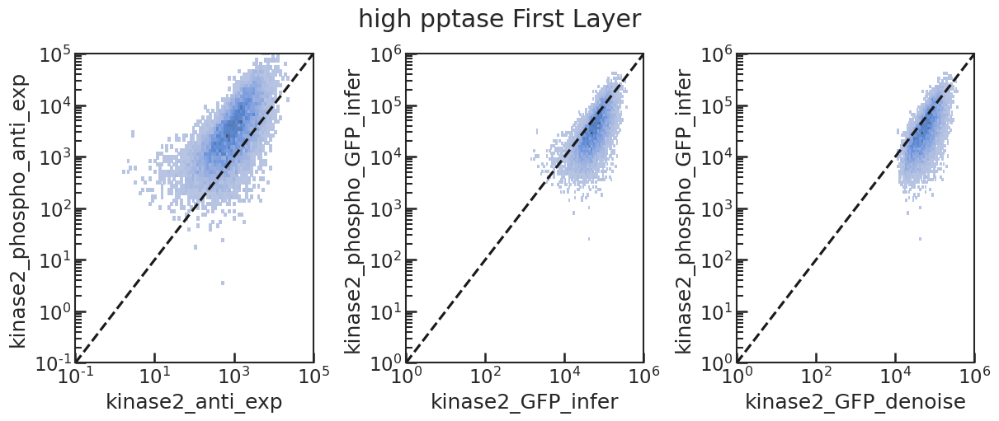

In [9]:

for exp_name, row in df_dataset_key.iterrows():
    
    df_tmp = df_data.query("exp_name==@exp_name")
            
    fig, axes = plt.subplots(1,3, constrained_layout=True, figsize=(12, 5), squeeze=False)
    ax = axes[0, 0]
    sns.histplot(df_tmp, x='substrate_anti_exp', y='phospho_anti_exp', ax=ax, log_scale=(True, True))
    ax.plot([1e-1, 1e5], [1e-1, 1e5], 'k--')
    
    ax.set_xlim(1e-1, 1e5)
    ax.set_ylim(1e-1, 1e5)
    
    ax = axes[0, 1]
    sns.histplot(df_tmp, x='substrate_GFP_infer', y='phospho_GFP_infer', ax=ax, log_scale=(True, True))
    ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
    
    ax.set_xlim(1e0, 1e6)
    ax.set_ylim(1e0, 1e6)
    
    ax = axes[0, 2]
    sns.histplot(df_tmp, x='substrate_GFP_denoise', y='phospho_GFP_infer', ax=ax, log_scale=(True, True))
    ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
    
    ax.set_xlim(1e0, 1e6)
    ax.set_ylim(1e0, 1e6)
    
    fig.suptitle(exp_name + " " + 'Second Layer')
    
    plt.show()
    
    if row['model'] == 'two_layer' or row['model'] == 'two_layer_nowriter'  or row['model'] == 'two_layer_noeraser':
    
        fig, axes = plt.subplots(1,3, constrained_layout=True, figsize=(12, 5), squeeze=False)
        ax = axes[0, 0]
        sns.histplot(df_tmp, x='kinase2_anti_exp', y='kinase2_phospho_anti_exp', ax=ax, log_scale=(True, True))
        ax.plot([1e-1, 1e5], [1e-1, 1e5], 'k--')

        ax.set_xlim(1e-1, 1e5)
        ax.set_ylim(1e-1, 1e5)

        ax = axes[0, 1]
        sns.histplot(df_tmp, x='kinase2_GFP_infer', y='kinase2_phospho_GFP_infer', ax=ax, log_scale=(True, True))
        ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
        
        ax.set_xlim(1e0, 1e6)
        ax.set_ylim(1e0, 1e6)
        
        ax = axes[0, 2]
        sns.histplot(df_tmp, x='kinase2_GFP_denoise', y='kinase2_phospho_GFP_infer', ax=ax, log_scale=(True, True))
        ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
        
        ax.set_xlim(1e0, 1e6)
        ax.set_ylim(1e0, 1e6)

        fig.suptitle(exp_name + " " + 'First Layer')

        plt.show()
        
                

    ###### add backgrounds dists to each of these plots!

# Load prefit parameters

In [36]:
try:
    df_params = pd.read_csv("../data/"+label+"/model_params.csv", sep=',', engine='python')   
except:
    df_params = None

# Uncomment this to overwrite all previous fits
df_params = None
    
display(df_params)

None

# Fit two layer data sets

In [42]:

df_params = fit.fit(df_dataset_key.query("model=='two_layer' or model=='two_layer_nowriter' or model=='two_layer_noeraser'"), df_data, df_params=df_params, noise_models=noise_models)

# df_params = fit.calc_error(df_dataset_key.query("model=='two_layer' or model=='two_layer_nowriter' or model=='two_layer_noeraser'"), df_data, df_params=df_params)

display(df_params)

{'phospho_sigma': 1.0866384803399085, 'kinase2_phospho_sigma': 0.7069540201338947, 'kin2_bg_phospho_rate': -1.0406957597598088, 'sub2_bg_phospho_rate': -1.8846258337488881, 'kinase1_wt': -0.6138265535527123, 'L+A': 3.379733542193379, 'pptase1_wt': -0.0037152509810659973, 'kinase2_wt': -0.4052417371912837, 'SH2': 2.6416744893112245, 'nb_SH2': 3.195680021205426, 'kinase2_dead': -0.8947490607171195, '1xSH2': 3.028577181334158}
{}
{'noise_model': ['phospho_sigma', 'kinase2_phospho_sigma'], 'two_layer': ['kin2_bg_phospho_rate', 'sub2_bg_phospho_rate', 'kinase1_wt', 'L+A', 'pptase1_wt', 'L+A', 'kinase2_wt', 'SH2'], 'nb SH2': ['kin2_bg_phospho_rate', 'sub2_bg_phospho_rate', 'kinase1_wt', 'L+A', 'pptase1_wt', 'L+A', 'kinase2_wt', 'nb_SH2'], 'no WT1': ['kin2_bg_phospho_rate', 'sub2_bg_phospho_rate', 'pptase1_wt', 'L+A', 'kinase2_wt', 'SH2'], 'WT2 dead': ['kin2_bg_phospho_rate', 'sub2_bg_phospho_rate', 'kinase1_wt', 'L+A', 'pptase1_wt', 'L+A', 'kinase2_dead', 'SH2'], 'mono': ['kin2_bg_phospho_ra

,name,val,val_min,val_max
0,phospho_sigma,1.086638,0.0,0.0
1,kinase2_phospho_sigma,0.706954,0.0,0.0
2,kin2_bg_phospho_rate,-1.040696,0.0,0.0
3,sub2_bg_phospho_rate,-1.884626,0.0,0.0
4,kinase1_wt,-0.613827,0.0,0.0
5,L+A,3.379734,0.0,0.0
6,pptase1_wt,-0.003715,0.0,0.0
7,kinase2_wt,-0.405242,0.0,0.0
8,SH2,2.641674,0.0,0.0
9,nb_SH2,3.195680,0.0,0.0


# Save model parameters


In [41]:
df_params.to_csv("../data/"+label+"/model_params.csv", sep=',', index=False)

# Calculate model predictions

In [45]:

prefit_params, param_to_index, dataset_to_params, x0, bounds = fit.setup_model_params(df_dataset_key, df_params=df_params, noise_models=noise_models)

x = np.zeros_like(x0)
for p in param_to_index:
    x[param_to_index[p]] = df_params.query("name==@p").iloc[0]['val']

args = (df_dataset_key, df_data, prefit_params, param_to_index, dataset_to_params, noise_models)

fit.predict(x, args, df_data)

display(df_data)

print(len(df_data))
print(len(df_data.dropna()))


kinase_anti_exp  phospho_anti_exp  pptase_anti_exp  \
exp_name    cell_index                                                       
two_layer   0               1132.644775       1478.883301      1425.913330   
            4               1442.491699        635.542847        88.930649   
            5               8793.622070        812.160950       146.514679   
            6               1792.821777       2214.880127        89.025887   
            8                201.405777       3024.554932       153.496933   
...                                 ...               ...              ...   
high pptase 195            59299.445310       7855.000977      9795.748047   
            196              208.313751        372.908508       202.584320   
            197            25951.003910       1579.916382      2093.736084   
            198              211.491653        507.318298       604.008911   
            199              446.477600        933.396423      2162.141357   

                        substrate_anti_exp  kinase2_anti_exp  \
exp_name    cell_index                                         
two_layer   0                  2399.792236       1518.167847   
            4                   523.847473       1035.239136   
            5                  7245.374023       2681.130859   
            6                  6909.660156       2263.580078   
            8                  3585.488770        449.934784   
...                                    ...               ...   
high pptase 195               19908.082030       3428.847656   
            196                1147.973999        294.995239   
            197                8990.183594        706.717163   
            198                 991.847046        712.914246   
            199                1407.085327       1187.735229   

                        kinase2_phospho_anti_exp  phospho_GFP_infer  \
exp_name    cell_index                                                
two_layer   0                        1701.817749        7374.915290   
            4                        5222.672852        4142.932616   
            5                       18908.003910        4898.079478   
            6                       14202.298830        9717.039625   
            8                        1672.440430       12020.611395   
...                                          ...                ...   
high pptase 195                     16475.460940       23064.448401   
            196                       786.826538        2878.770825   
            197                      5654.137207        7715.320440   
            198                      1160.248291        3552.095459   
            199                      1436.169312        5386.222318   

                        substrate_GFP_infer  kinase_GFP_infer  \
exp_name    cell_index                                          
two_layer   0                  79420.305908      14467.199881   
            4                  24799.658349      17623.765918   
            5                 184898.125267      77061.869262   
            6                 178309.792432      21045.775626   
            8                 107966.060818       3533.754738   
...                                     ...               ...   
high pptase 195               400534.913582     365891.161101   
            196                45187.879803       3632.370139   
            197               218070.502652     186393.196494   
            198                40408.158389       3677.533840   
            199                52798.102455       6767.220162   

                        pptase_GFP_infer  ...  pptase_GFP_denoise  \
exp_name    cell_index                    ...                       
two_layer   0               18909.544251  ...        18675.791484   
            4                2335.628088  ...         2572.185964   
            5                3402.788514  ...         3178.427362   
            6                2337.513133  ...         2572.84

1058
1058


# Convert predicted MOCU values to antibody values

In [46]:
df_data['phospho_GFP_denoise'] = 0.0
df_data['phospho_GFP_predict'] = 0.0
df_data['phospho_anti_predict'] = 0.0
df_data['kinase2_phospho_GFP_denoise'] = 0.0
df_data['kinase2_phospho_GFP_predict'] = 0.0
df_data['kinase2_phospho_anti_predict'] = 0.0


for exp_name, row in df_dataset_key.iterrows():
    
    phospho_factor = row['substrate_phospho_factor']
    kinase2_phospho_factor = row['kinase2_phospho_factor']

    df_tmp = df_data.query("exp_name==@exp_name")
    
    phospho_sigma = df_params.query("name=='phospho_sigma'")['val'].values[0]

    MOCU = phospho_factor*df_data.loc[df_tmp.index, 'phospho_MOCU_predict']
    
    df_data.loc[df_tmp.index, 'phospho_GFP_denoise'] = MOCU + noise_models['phospho']['anti_as_GFP_background'].mean
        
    df_data.loc[df_tmp.index, 'phospho_GFP_predict'] = noise_models['phospho']['GFP2MOCU'].sample(MOCU, phospho_sigma)

    df_data.loc[df_tmp.index, 'phospho_anti_predict'] = noise_models['phospho']['anti2GFP'].inverse_transform(df_data.loc[df_tmp.index, 'phospho_GFP_predict'])

    
    kinase2_phospho_sigma = df_params.query("name=='kinase2_phospho_sigma'")['val'].values[0]

    MOCU = kinase2_phospho_factor*df_data.loc[df_tmp.index, 'kinase2_phospho_MOCU_predict']
    
    df_data.loc[df_tmp.index, 'kinase2_phospho_GFP_denoise'] = MOCU + noise_models['kinase2_phospho']['anti_as_GFP_background'].mean
        
    df_data.loc[df_tmp.index, 'kinase2_phospho_GFP_predict'] = noise_models['kinase2_phospho']['GFP2MOCU'].sample(MOCU, kinase2_phospho_sigma)

    df_data.loc[df_tmp.index, 'kinase2_phospho_anti_predict'] = noise_models['kinase2_phospho']['anti2GFP'].inverse_transform(df_data.loc[df_tmp.index, 'kinase2_phospho_GFP_predict'])

    
display(df_data)

kinase_anti_exp  phospho_anti_exp  pptase_anti_exp  \
exp_name    cell_index                                                       
two_layer   0               1132.644775       1478.883301      1425.913330   
            4               1442.491699        635.542847        88.930649   
            5               8793.622070        812.160950       146.514679   
            6               1792.821777       2214.880127        89.025887   
            8                201.405777       3024.554932       153.496933   
...                                 ...               ...              ...   
high pptase 195            59299.445310       7855.000977      9795.748047   
            196              208.313751        372.908508       202.584320   
            197            25951.003910       1579.916382      2093.736084   
            198              211.491653        507.318298       604.008911   
            199              446.477600        933.396423      2162.141357   

                        substrate_anti_exp  kinase2_anti_exp  \
exp_name    cell_index                                         
two_layer   0                  2399.792236       1518.167847   
            4                   523.847473       1035.239136   
            5                  7245.374023       2681.130859   
            6                  6909.660156       2263.580078   
            8                  3585.488770        449.934784   
...                                    ...               ...   
high pptase 195               19908.082030       3428.847656   
            196                1147.973999        294.995239   
            197                8990.183594        706.717163   
            198                 991.847046        712.914246   
            199                1407.085327       1187.735229   

                        kinase2_phospho_anti_exp  phospho_GFP_infer  \
exp_name    cell_index                                                
two_layer   0                        1701.817749        7374.915290   
            4                        5222.672852        4142.932616   
            5                       18908.003910        4898.079478   
            6                       14202.298830        9717.039625   
            8                        1672.440430       12020.611395   
...                                          ...                ...   
high pptase 195                     16475.460940       23064.448401   
            196                       786.826538        2878.770825   
            197                      5654.137207        7715.320440   
            198                      1160.248291        3552.095459   
            199                      1436.169312        5386.222318   

                        substrate_GFP_infer  kinase_GFP_infer  \
exp_name    cell_index                                          
two_layer   0                  79420.305908      14467.199881   
            4                  24799.658349      17623.765918   
            5                 184898.125267      77061.869262   
            6                 178309.792432      21045.775626   
            8                 107966.060818       3533.754738   
...                                     ...               ...   
high pptase 195               400534.913582     365891.161101   
            196                45187.879803       3632.370139   
            197               218070.502652     186393.196494   
            198                40408.158389       3677.533840   
            199                52798.102455       6767.220162   

                        pptase_GFP_infer  ...  pptase_GFP_denoise  \
exp_name    cell_index                    ...                       
two_layer   0               18909.544251  ...        18675.791484   
            4                2335.628088  ...         2572.185964   
            5                3402.788514  ...         3178.427362   
            6                2337.513133  ...         2572.84

# Save predictions

In [ ]:
df_data.to_csv("../data/"+label+"/model_predictions.csv", sep=',')

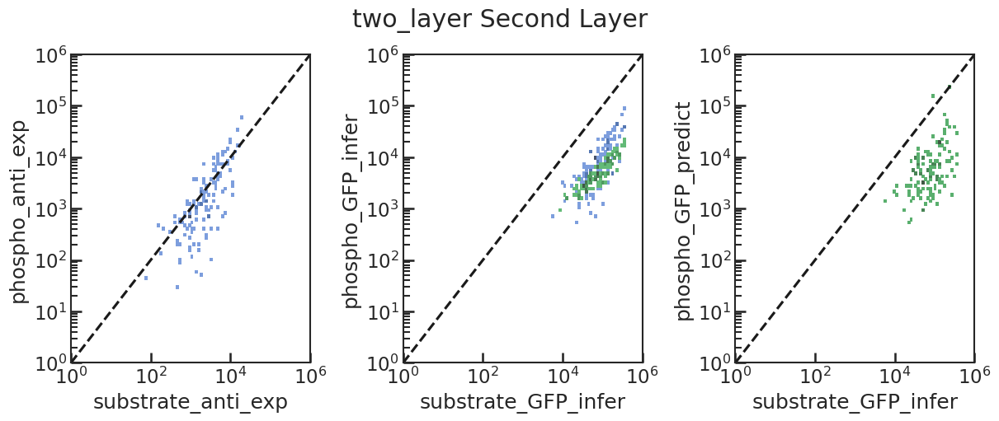

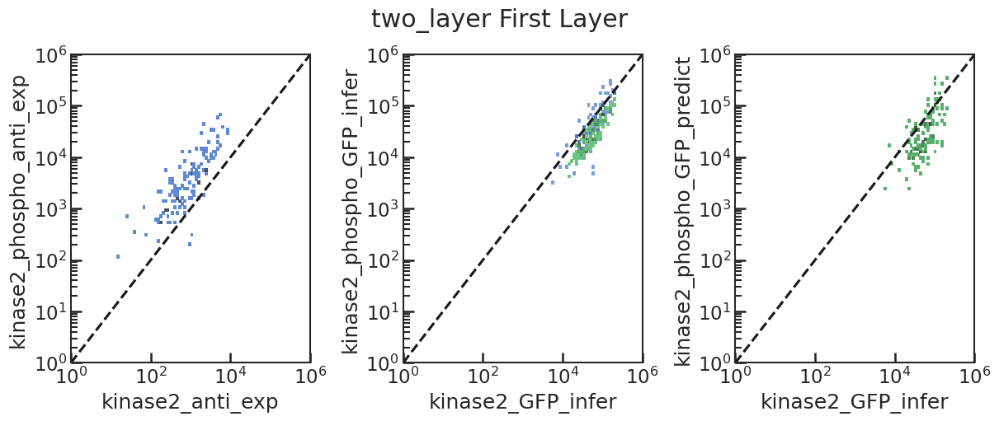

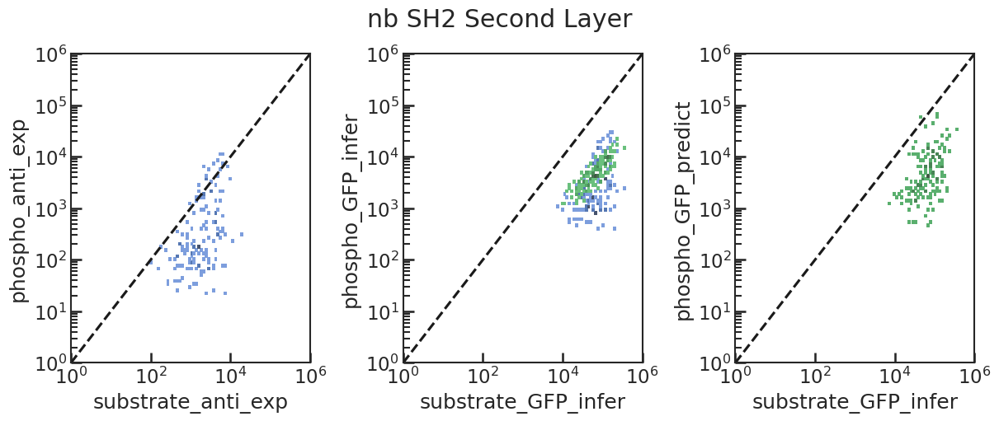

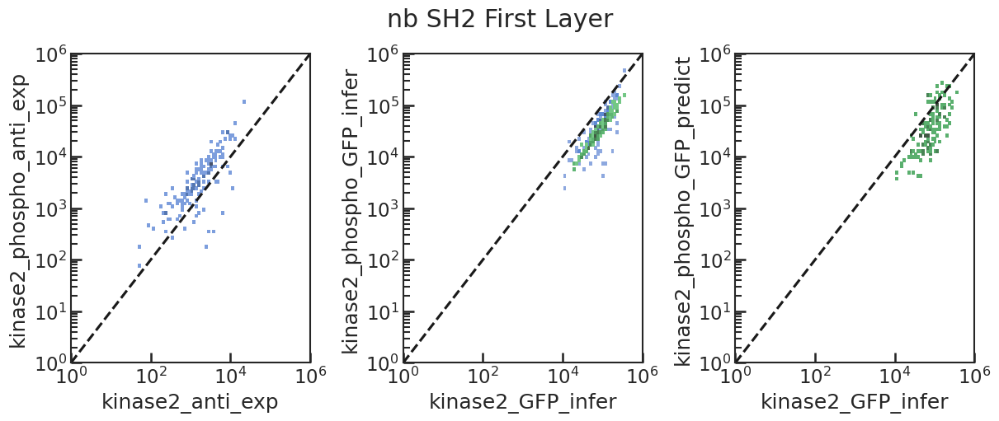

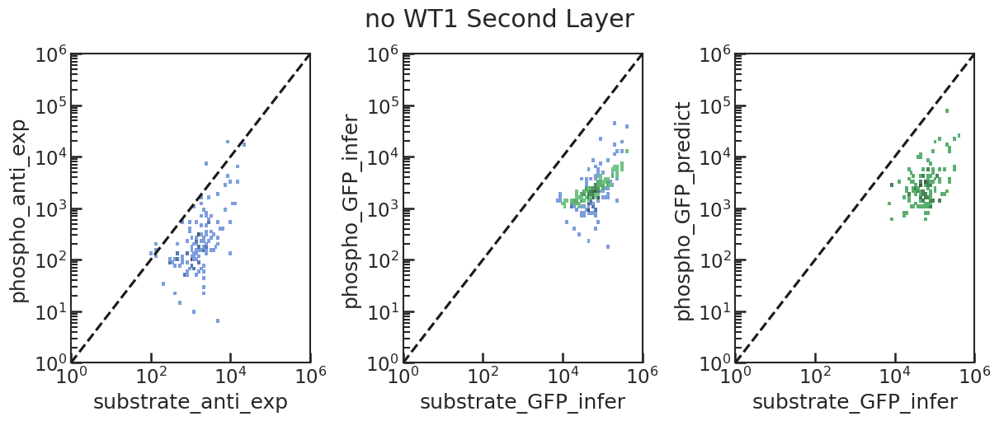

...

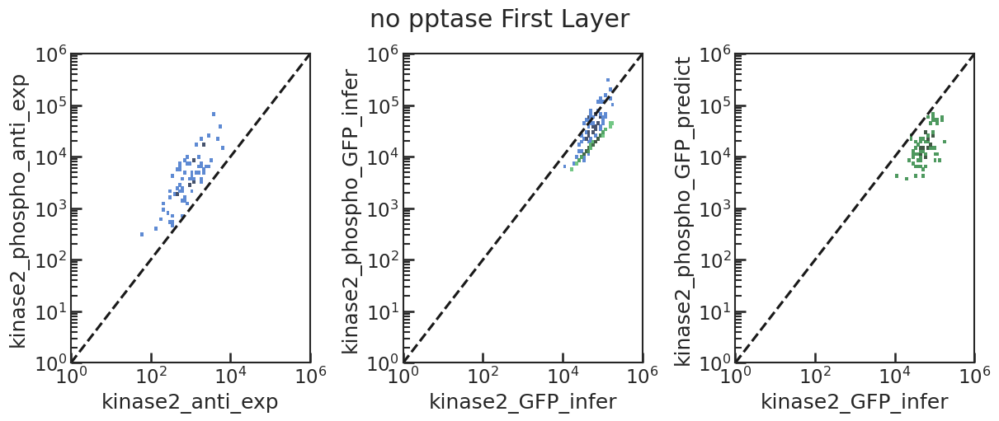

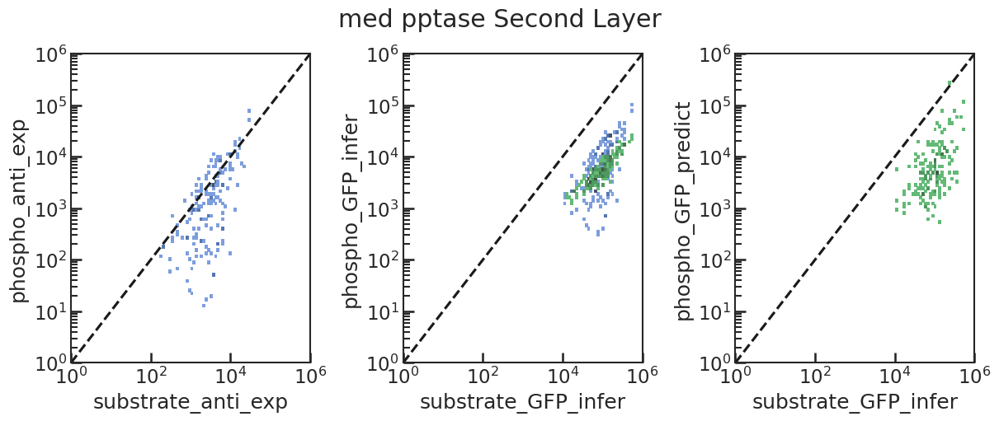

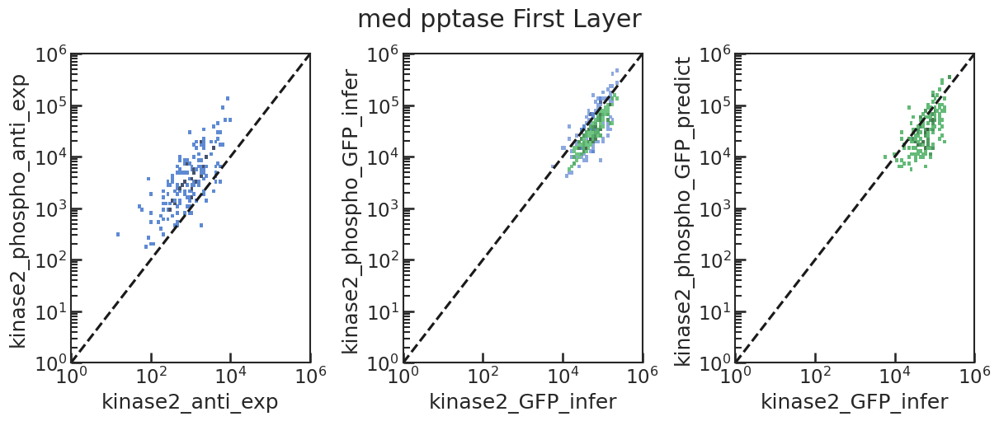

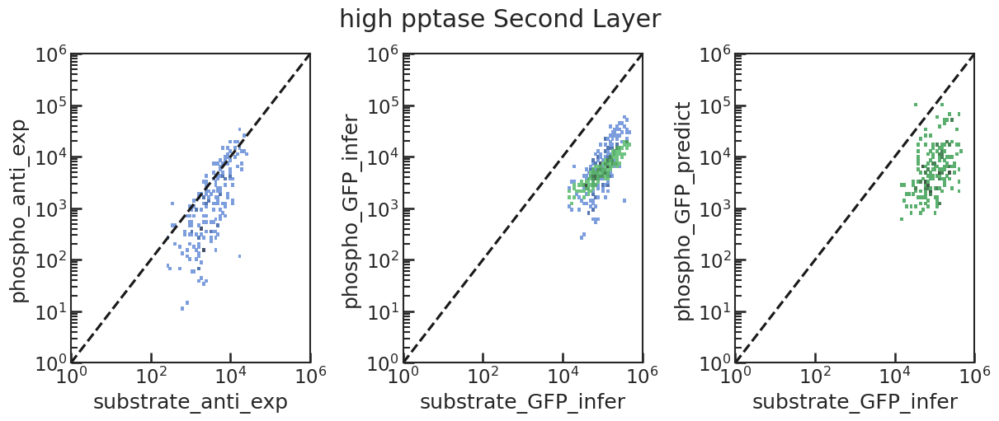

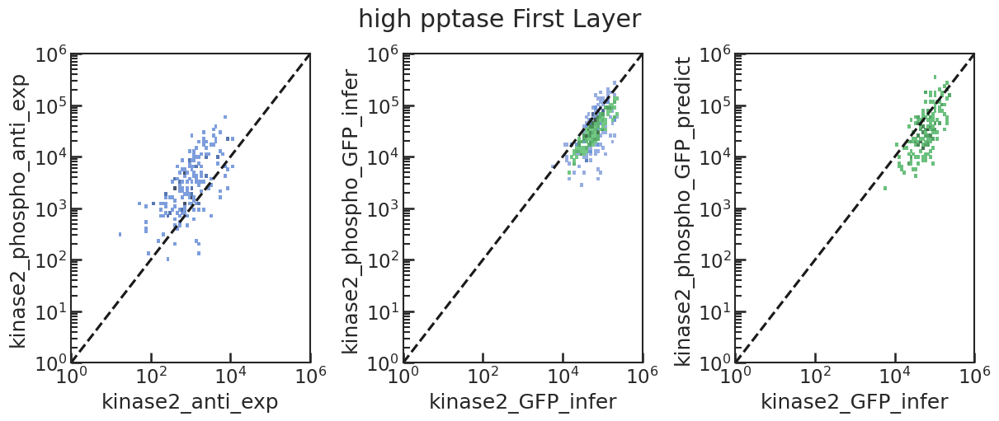

In [48]:
for exp_name, row in df_dataset_key.iterrows():

    
    df_tmp = df_data.query("exp_name==@exp_name")
            
    fig, axes = plt.subplots(1,3, constrained_layout=True, figsize=(12, 5), squeeze=False)
    ax = axes[0, 0]
    
    sns.histplot(df_tmp, x='substrate_anti_exp', y='phospho_anti_exp', ax=ax, log_scale=(True, True), binrange=[[0, 6], [0, 6]], bins=100)
    ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
    
    ax.set_xlim(1e0, 1e6)
    ax.set_ylim(1e0, 1e6)
    
    ax = axes[0, 1]
    sns.histplot(df_tmp, x='substrate_GFP_infer', y='phospho_GFP_infer', ax=ax, log_scale=(True, True), binrange=[[0, 6], [0, 6]], bins=100)
    ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
#     ax.plot([1e0, 1e6], [2*1e0, 2*1e6], 'r--')
    sns.histplot(df_tmp, x='substrate_GFP_denoise', y='phospho_GFP_denoise', ax=ax, log_scale=(True, True), color='g', binrange=[[0, 6], [0, 6]], bins=100)

    ax.set_xlim(1e0, 1e6)
    ax.set_ylim(1e0, 1e6)
    
    ax = axes[0, 2]
    ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
    
    sns.histplot(df_tmp, x='substrate_GFP_infer', y='phospho_GFP_predict', ax=ax, log_scale=(True, True), color='g', binrange=[[0, 6], [0, 6]], bins=100)
    
    ax.set_xlim(1e0, 1e6)
    ax.set_ylim(1e0, 1e6)
    
    fig.suptitle(exp_name + " Second Layer")
    
    plt.show()
    
    
    fig, axes = plt.subplots(1,3, constrained_layout=True, figsize=(12, 5), squeeze=False)
    ax = axes[0, 0]
    
    sns.histplot(df_tmp, x='kinase2_anti_exp', y='kinase2_phospho_anti_exp', ax=ax, log_scale=(True, True), binrange=[[0, 6], [0, 6]], bins=100)
    ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
    
    ax.set_xlim(1e0, 1e6)
    ax.set_ylim(1e0, 1e6)
    
    ax = axes[0, 1]
    sns.histplot(df_tmp, x='kinase2_GFP_infer', y='kinase2_phospho_GFP_infer', ax=ax, log_scale=(True, True), binrange=[[0, 6], [0, 6]], bins=100)
    ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
#     ax.plot([1e0, 1e6], [2*1e0, 2*1e6], 'r--')
    sns.histplot(df_tmp, x='kinase2_GFP_denoise', y='kinase2_phospho_GFP_denoise', ax=ax, log_scale=(True, True), color='g', binrange=[[0, 6], [0, 6]], bins=100)

    ax.set_xlim(1e0, 1e6)
    ax.set_ylim(1e0, 1e6)
    
    ax = axes[0, 2]
    ax.plot([1e0, 1e6], [1e0, 1e6], 'k--')
    
    sns.histplot(df_tmp, x='kinase2_GFP_infer', y='kinase2_phospho_GFP_predict', ax=ax, log_scale=(True, True), color='g', binrange=[[0, 6], [0, 6]], bins=100)
    
    ax.set_xlim(1e0, 1e6)
    ax.set_ylim(1e0, 1e6)
    
    fig.suptitle(exp_name + " First Layer")
    
    plt.show()